In [1]:
%run "la_00.ipynb"

In [2]:
def get_native_position(gene, pseudoposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_index = dict(zip(all_genes, range(4)))
    return pseudopos_to_nativepos[pseudoposition][gene_index[gene]]

def get_native_aa(gene, pseudoposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_index = dict(zip(all_genes, range(4)))
    return pseudopos_to_nativeaa[pseudoposition][gene_index[gene]]

def get_PDB_position(gene, pseudoposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_structures = ['2wur.pdb', 'amacGFP_prediction.pdb', '2hpw.pdb', '2g3o.pdb']
    gene_index = dict(zip(all_genes, range(4)))
    gene_coefficients = dict(zip(all_genes, [1,1,1,1])) # shifts to add to native positions to get PDB numbering
    return pseudopos_to_nativepos[pseudoposition][gene_index[gene]] + gene_coefficients[gene]

def PDB_to_pseudo_position(gene, pdbposition):
    all_genes = ['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP']
    gene_structures = ['2wur.pdb', 'amacGFP_prediction.pdb', '2hpw.pdb', '2g3o.pdb']
    gene_index = dict(zip(all_genes, range(4)))
    gene_coefficients = dict(zip(all_genes, [1,1,1,1])) # shifts to add to native positions to get PDB numbering
    return nativepos_to_pseudopos[pdbposition][gene_index[gene]] - gene_coefficients[gene]

gene_structures = dict(zip(['avGFP', 'amacGFP', 'cgreGFP', 'ppluGFP'], 
                      ['2wur.pdb', 'amacGFP_prediction.pdb', '2hpw.pdb', '2g3o.pdb']))

In [3]:
by_nt_upd

,Unnamed: 0,nt_genotype,gene,aa_genotype_pseudo,total_cell_count,n_replicates,replicates_stdev_weighted,replicates_mean_brightness,index_of_dispersion,coefficient_of_variation,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_genotype_native
0,0,A100C,amacGFP,E36A,165.00,13.0,1059.270957,9890.458378,113.448226,0.107100,NaN,NaN,NaN,NaN,E33A
1,1,A100C:A144T:C172A,amacGFP,E36A:T51S:P60H,30.97,2.0,106.887117,244.496125,46.728167,0.437173,NaN,NaN,NaN,NaN,E33A:T48S:P57H
2,2,A100C:A304C:A436C:T452C:T532C:C566T,amacGFP,E36A:D105A:N149T:L181P,53.61,5.0,289.737621,2482.724391,33.812810,0.116701,NaN,NaN,NaN,NaN,E33A:D101A:N145T:L177P
3,3,A100C:A349T,amacGFP,E36A:D120V,39.33,2.0,339.869768,9488.274423,12.174127,0.035820,NaN,NaN,NaN,NaN,E33A:D116V
4,4,A100C:A489T:T667C:G681T,amacGFP,E36A:N167Y:F230S:G235W,72.07,6.0,772.824837,6390.797011,93.455985,0.120928,NaN,NaN,NaN,NaN,E33A:N163Y:F222S:G227W
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126561,125673,T661C:C662G:G663C:C664A:A665T:T666G:G667A:A668T,ppluGFP,F240S:A241H:*246D,112.07,6.0,875.145638,25428.434250,30.119034,0.034416,NaN,NaN,NaN,NaN,F220S:A221H:*222D
126562,125679,T666A:G667T:A668G,ppluGFP,*246M,132.15,8.0,1199.467386,15983.172132,90.014798,0.075046,NaN,NaN,NaN,NaN,*222M
126563,125682,T666C,ppluGFP,*246R,756.39,31.0,2435.088387,17816.379818,332.820445,0.136677,NaN,NaN,NaN,NaN,*222R
126564,125686,T666G,ppluGFP,*246G,491.92,34.0,2395.264114,17325.780293,331.141806,0.138249,NaN,NaN,NaN,NaN,*222G


In [4]:
by_nt_upd['replicates_mean_brightness'] = by_nt_upd['replicates_mean_brightness'].apply(np.log10)
by_nt_upd

,Unnamed: 0,nt_genotype,gene,aa_genotype_pseudo,total_cell_count,n_replicates,replicates_stdev_weighted,replicates_mean_brightness,index_of_dispersion,coefficient_of_variation,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_genotype_native
0,0,A100C,amacGFP,E36A,165.00,13.0,1059.270957,3.995216,113.448226,0.107100,NaN,NaN,NaN,NaN,E33A
1,1,A100C:A144T:C172A,amacGFP,E36A:T51S:P60H,30.97,2.0,106.887117,2.388272,46.728167,0.437173,NaN,NaN,NaN,NaN,E33A:T48S:P57H
2,2,A100C:A304C:A436C:T452C:T532C:C566T,amacGFP,E36A:D105A:N149T:L181P,53.61,5.0,289.737621,3.394929,33.812810,0.116701,NaN,NaN,NaN,NaN,E33A:D101A:N145T:L177P
3,3,A100C:A349T,amacGFP,E36A:D120V,39.33,2.0,339.869768,3.977187,12.174127,0.035820,NaN,NaN,NaN,NaN,E33A:D116V
4,4,A100C:A489T:T667C:G681T,amacGFP,E36A:N167Y:F230S:G235W,72.07,6.0,772.824837,3.805555,93.455985,0.120928,NaN,NaN,NaN,NaN,E33A:N163Y:F222S:G227W
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126561,125673,T661C:C662G:G663C:C664A:A665T:T666G:G667A:A668T,ppluGFP,F240S:A241H:*246D,112.07,6.0,875.145638,4.405320,30.119034,0.034416,NaN,NaN,NaN,NaN,F220S:A221H:*222D
126562,125679,T666A:G667T:A668G,ppluGFP,*246M,132.15,8.0,1199.467386,4.203663,90.014798,0.075046,NaN,NaN,NaN,NaN,*222M
126563,125682,T666C,ppluGFP,*246R,756.39,31.0,2435.088387,4.250819,332.820445,0.136677,NaN,NaN,NaN,NaN,*222R
126564,125686,T666G,ppluGFP,*246G,491.92,34.0,2395.264114,4.238693,331.141806,0.138249,NaN,NaN,NaN,NaN,*222G


In [5]:
#Take the gene names of the dataset

genes = sorted(set(by_nt_upd.gene))

genes

['amacGFP', 'cgreGFP', 'ppluGFP']

In [6]:
#Calculate the brightness of the wildtype genes

wt_brightness = {}
for gene in genes:
    wt = by_nt_upd[(by_nt_upd['gene']== gene) & (by_nt_upd['nt_genotype']=='wt')]
    wt_brightness[gene] = wt['replicates_mean_brightness'].median()
    
wt_brightness

{'amacGFP': 3.9759417642196695,
 'cgreGFP': 4.494366479589088,
 'ppluGFP': 4.2269429241006415}

In [7]:
#Create a new dataset which will be sorted by gene, amino acid genotype and nucleotide genotype

aa_mut = by_nt_upd.groupby(['gene','aa_genotype_pseudo', 'aa_genotype_native','nt_genotype']).agg({
                         'total_cell_count': np.sum, 'n_replicates': np.sum, 
                         'replicates_mean_brightness': np.median, 
                        'ddG_monomer': np.median, 'ddG_monomer_stdev': np.median,
                        'ddG_dimer': np.median, 'ddG_dimer_stdev': np.median})
aa_mut.reset_index(inplace=True)

aa_mut

,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev
0,amacGFP,*246G,*238G,A461C:T714G,53.70,6.0,3.966691,NaN,NaN,NaN,NaN
1,amacGFP,*246G,*238G,A461T:T714G,173.12,12.0,3.989159,NaN,NaN,NaN,NaN
2,amacGFP,*246G,*238G,C131A:T714G,39.57,2.0,3.956547,NaN,NaN,NaN,NaN
3,amacGFP,*246G,*238G,C347A:T714G,64.67,5.0,3.924950,NaN,NaN,NaN,NaN
4,amacGFP,*246G,*238G,C579T:T714G,33.31,4.0,4.059697,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
126561,ppluGFP,wt,wt,T659A,2550.52,100.0,4.229176,NaN,NaN,NaN,NaN
126562,ppluGFP,wt,wt,T659A:C662T,241.75,6.0,4.241842,NaN,NaN,NaN,NaN
126563,ppluGFP,wt,wt,T659C,3953.45,174.0,4.227871,NaN,NaN,NaN,NaN
126564,ppluGFP,wt,wt,T659G,1991.66,49.0,4.225663,NaN,NaN,NaN,NaN


In [8]:
aa_mut_cgreGFP = aa_mut[aa_mut.gene=='cgreGFP']
aa_mut_cgreGFP.reset_index(inplace=True)

aa_mut_cgreGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev
0,45623,cgreGFP,*246C,*235C,A707T,87.78,4.0,4.302271,NaN,NaN,NaN,NaN
1,45624,cgreGFP,*246G,*235G,T705G,1499.77,22.0,4.466539,NaN,NaN,NaN,NaN
2,45625,cgreGFP,A113D,A110D,C331A,274.17,8.0,2.299773,6.7,2.16,5.38,0.94
3,45626,cgreGFP,A113D:E229D,A110D:E223D,C331A:G671T,51.53,8.0,2.425549,NaN,NaN,NaN,NaN
4,45627,cgreGFP,A113D:E239D,A110D:E231D,C331A:A695T,232.24,4.0,1.976627,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
33777,79400,cgreGFP,wt,wt,T95C:G593A,134.83,6.0,4.552573,NaN,NaN,NaN,NaN
33778,79401,cgreGFP,wt,wt,T95C:T242C,155.04,4.0,4.491330,NaN,NaN,NaN,NaN
33779,79402,cgreGFP,wt,wt,T95C:T242C:A449T,210.31,6.0,4.488483,NaN,NaN,NaN,NaN
33780,79403,cgreGFP,wt,wt,T95C:T542C:A608C,205.55,7.0,4.496849,NaN,NaN,NaN,NaN


In [9]:
mean_bright_cgreGFP = aa_mut_cgreGFP['replicates_mean_brightness'].median()
mean_bright_cgreGFP

4.330592586385778

In [10]:
#aa_mut_cgreGFP['replicates_mean_brightness'] = aa_mut_cgreGFP['replicates_mean_brightness']/21408.812884022645
#ben_mut_amacGFP = aa_mut_amacGFP.loc[aa_mut_amacGFP['replicates_mean_brightness'] >= 0.7]
ben_mut_cgreGFP=aa_mut_cgreGFP.copy()
ben_mut_cgreGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev
0,45623,cgreGFP,*246C,*235C,A707T,87.78,4.0,4.302271,NaN,NaN,NaN,NaN
1,45624,cgreGFP,*246G,*235G,T705G,1499.77,22.0,4.466539,NaN,NaN,NaN,NaN
2,45625,cgreGFP,A113D,A110D,C331A,274.17,8.0,2.299773,6.7,2.16,5.38,0.94
3,45626,cgreGFP,A113D:E229D,A110D:E223D,C331A:G671T,51.53,8.0,2.425549,NaN,NaN,NaN,NaN
4,45627,cgreGFP,A113D:E239D,A110D:E231D,C331A:A695T,232.24,4.0,1.976627,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
33777,79400,cgreGFP,wt,wt,T95C:G593A,134.83,6.0,4.552573,NaN,NaN,NaN,NaN
33778,79401,cgreGFP,wt,wt,T95C:T242C,155.04,4.0,4.491330,NaN,NaN,NaN,NaN
33779,79402,cgreGFP,wt,wt,T95C:T242C:A449T,210.31,6.0,4.488483,NaN,NaN,NaN,NaN
33780,79403,cgreGFP,wt,wt,T95C:T542C:A608C,205.55,7.0,4.496849,NaN,NaN,NaN,NaN


In [11]:
sum_mut = lambda s: (len(s)>0)*(len(s.split(':'))) if s!='wt' else 0
ben_mut_cgreGFP['aa_mutnumber'] = ben_mut_cgreGFP['aa_genotype_pseudo'].apply(sum_mut)
ben_mut_cgreGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_mutnumber
0,45623,cgreGFP,*246C,*235C,A707T,87.78,4.0,4.302271,NaN,NaN,NaN,NaN,1
1,45624,cgreGFP,*246G,*235G,T705G,1499.77,22.0,4.466539,NaN,NaN,NaN,NaN,1
2,45625,cgreGFP,A113D,A110D,C331A,274.17,8.0,2.299773,6.7,2.16,5.38,0.94,1
3,45626,cgreGFP,A113D:E229D,A110D:E223D,C331A:G671T,51.53,8.0,2.425549,NaN,NaN,NaN,NaN,2
4,45627,cgreGFP,A113D:E239D,A110D:E231D,C331A:A695T,232.24,4.0,1.976627,NaN,NaN,NaN,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
33777,79400,cgreGFP,wt,wt,T95C:G593A,134.83,6.0,4.552573,NaN,NaN,NaN,NaN,0
33778,79401,cgreGFP,wt,wt,T95C:T242C,155.04,4.0,4.491330,NaN,NaN,NaN,NaN,0
33779,79402,cgreGFP,wt,wt,T95C:T242C:A449T,210.31,6.0,4.488483,NaN,NaN,NaN,NaN,0
33780,79403,cgreGFP,wt,wt,T95C:T542C:A608C,205.55,7.0,4.496849,NaN,NaN,NaN,NaN,0


In [12]:
ben_mut_cgreGFP = ben_mut_cgreGFP[ben_mut_cgreGFP['aa_mutnumber'] <= 10]
ben_mut_cgreGFP.aa_mutnumber.max()

10

In [13]:
ben_mut_cgreGFP = ben_mut_cgreGFP.loc[ben_mut_cgreGFP['aa_genotype_pseudo'] != 'wt']
ben_mut_cgreGFP

,index,gene,aa_genotype_pseudo,aa_genotype_native,nt_genotype,total_cell_count,n_replicates,replicates_mean_brightness,ddG_monomer,ddG_monomer_stdev,ddG_dimer,ddG_dimer_stdev,aa_mutnumber
0,45623,cgreGFP,*246C,*235C,A707T,87.78,4.0,4.302271,NaN,NaN,NaN,NaN,1
1,45624,cgreGFP,*246G,*235G,T705G,1499.77,22.0,4.466539,NaN,NaN,NaN,NaN,1
2,45625,cgreGFP,A113D,A110D,C331A,274.17,8.0,2.299773,6.70,2.16,5.38,0.94,1
3,45626,cgreGFP,A113D:E229D,A110D:E223D,C331A:G671T,51.53,8.0,2.425549,NaN,NaN,NaN,NaN,2
4,45627,cgreGFP,A113D:E239D,A110D:E231D,C331A:A695T,232.24,4.0,1.976627,NaN,NaN,NaN,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32187,77810,cgreGFP,Y95N:P150S:G178S,Y92N:P147S:G175S,T276A:G347A:C441T:G525A,17.76,4.0,2.840796,NaN,NaN,NaN,NaN,3
32188,77811,cgreGFP,Y95N:R99L:G120D:N188S:K232M,Y92N:R96L:G117D:N185S:K226M,T276A:G289T:G352A:A556G:A679T,183.87,4.0,2.460343,NaN,NaN,NaN,NaN,5
32190,77813,cgreGFP,Y95S,Y92S,A227G:A277C,15.46,3.0,2.140907,6.63,0.62,10.46,0.33,1
32191,77814,cgreGFP,Y95S,Y92S,T5C:C165T:A277C,22.12,4.0,2.328910,6.63,0.62,10.46,0.33,1


In [14]:
position_ben_sing_cgreGFP = {}               

for index, row in ben_mut_cgreGFP.iterrows(): 
        if ':' not in row["aa_genotype_pseudo"]:
            position_ben_sing_cgreGFP[index] = row["aa_genotype_pseudo"]
            
position_ben_sing_cgreGFP = pd.DataFrame.from_dict(position_ben_sing_cgreGFP, orient='index')

position_ben_sing_cgreGFP.columns=['aa_mutation']
position_ben_sing_cgreGFP

,aa_mutation
0,*246C
1,*246G
2,A113D
11,A113G
14,A113S
...,...
32153,Y95H
32154,Y95H
32178,Y95N
32190,Y95S


In [15]:
position_ben_mult_cgreGFP={}

for index, row in ben_mut_cgreGFP.iterrows(): 
        if ':' in row["aa_genotype_pseudo"]:
            position_ben_mult_cgreGFP[index] = (row["aa_genotype_pseudo"].split(":"))
            
position_ben_mult_cgreGFP = pd.DataFrame.from_dict(position_ben_mult_cgreGFP, orient='index')
position_ben_mult_cgreGFP=position_ben_mult_cgreGFP.stack()
position_ben_mult_cgreGFP=pd.DataFrame(position_ben_mult_cgreGFP)
position_ben_mult_cgreGFP.columns=['aa_mutation']
position_ben_mult_cgreGFP = position_ben_mult_cgreGFP.reset_index()
position_ben_mult_cgreGFP=position_ben_mult_cgreGFP.drop(['level_0', 'level_1'], axis=1)

position_ben_mult_cgreGFP

,aa_mutation
0,A113D
1,E229D
2,A113D
3,E239D
4,A113D
...,...
75069,N188S
75070,K232M
75071,Y95S
75072,Y117F


In [16]:
ben_frames = [position_ben_mult_cgreGFP,position_ben_mult_cgreGFP]
position_ben_cgreGFP = pd.concat(ben_frames)

In [17]:
mut_unique_cgre = position_ben_cgreGFP.aa_mutation.unique()
mut_unique_cgre = np.ndarray.tolist(mut_unique_cgre)
mut_unique_cgre

['A113D',
 'E229D',
 'E239D',
 'H147Q',
 'K165R',
 'A193T',
 'K114I',
 'M175K',
 'K114R',
 'V128L',
 'V144I',
 'V234I',
 'A113G',
 'T116M',
 'P217R',
 'A113S',
 'A171V',
 'W210R',
 'E239*',
 'F172L',
 'H206R',
 'K134R',
 'K170M',
 'M175T',
 'L191P',
 'K215N',
 'M142L',
 'M175L',
 'H206Q',
 'L207M',
 'N124D',
 'T121S',
 'T208I',
 'Y154C',
 'Q186L',
 'A113T',
 'D235N',
 'E118G',
 'G130D',
 'E196K',
 'D223V',
 'E196G',
 'K189R',
 'G176S',
 'A233G',
 'A113V',
 'A193S',
 'E195G',
 'H151L',
 'K170E',
 'M181I',
 'N169I',
 'P217S',
 'K232R',
 'S135*',
 'V174E',
 'A152D',
 'L191H',
 'A152E',
 'D173G',
 'L203P',
 'E196D',
 'G214C',
 'H179P',
 'S212G',
 'S212R',
 'Y154F',
 'N169H',
 'D223G',
 'A152P',
 'H205P',
 'K232M',
 'D220G',
 'A152S',
 'A185T',
 'D220V',
 'G178A',
 'K189M',
 'K215T',
 'N188I',
 'L203V',
 'S212T',
 'Y198F',
 'A152T',
 'A171T',
 'A233V',
 'D173V',
 'L191R',
 'D219G',
 'R245H',
 'G176A',
 'G214V',
 'H179N',
 'H179R',
 'H184Y',
 'H205R',
 'P190T',
 'L156M',
 'N188D',
 'I231V',


In [18]:
print(type(mut_unique_cgre))

<class 'list'>


In [19]:
all_mut_bac={}

for mutation in mut_unique_cgre:
    mut_bac= ben_mut_cgreGFP[ben_mut_cgreGFP['aa_genotype_pseudo'].apply(lambda multi: mutation in multi.split(':'))]
    background = mut_bac['aa_genotype_pseudo'].apply(lambda nom: ':'.join([m for m in nom.split(':') if m != mutation]))
    mut_bac['mut_background']=background
    mut_bac['mutation'] = mutation
    mut_bac['bright_mutation'] = ben_mut_cgreGFP[ben_mut_cgreGFP['aa_genotype_pseudo']==mutation]['replicates_mean_brightness'].median()
    all_mut_bac[mutation]=mut_bac
    
all_mut_bac

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https

{'A113D':        index     gene                     aa_genotype_pseudo  \
 2      45625  cgreGFP                                  A113D   
 3      45626  cgreGFP                            A113D:E229D   
 4      45627  cgreGFP                            A113D:E239D   
 5      45628  cgreGFP                A113D:H147Q:K165R:A193T   
 6      45629  cgreGFP                      A113D:K114I:M175K   
 7      45630  cgreGFP                            A113D:K114R   
 8      45631  cgreGFP                            A113D:V128L   
 9      45632  cgreGFP                            A113D:V144I   
 10     45633  cgreGFP                            A113D:V234I   
 1628   47251  cgreGFP           C50F:A113D:N124Y:A171V:L236M   
 2137   47760  cgreGFP                            D110E:A113D   
 5729   51352  cgreGFP                             E21D:A113D   
 9376   54999  cgreGFP                             G22A:A113D   
 10054  55677  cgreGFP                 G53C:A113D:L140M:V230I   
 15216  60839  c

In [20]:
dict_of_df = {k:pd.DataFrame(v) for k,v in all_mut_bac.items()}
df_bis=pd.concat(dict_of_df,axis=0)

In [21]:
df_bis =df_bis.drop(columns=['nt_genotype', 'total_cell_count','n_replicates','ddG_monomer',
                            'ddG_monomer_stdev','ddG_dimer','ddG_dimer_stdev'])
df_bis

index     gene                     aa_genotype_pseudo  \
A113D 2      45625  cgreGFP                                  A113D   
      3      45626  cgreGFP                            A113D:E229D   
      4      45627  cgreGFP                            A113D:E239D   
      5      45628  cgreGFP                A113D:H147Q:K165R:A193T   
      6      45629  cgreGFP                      A113D:K114I:M175K   
...            ...      ...                                    ...   
L63I  31687  77310  cgreGFP  Y48H:L63I:V70M:Y76H:L122Q:S135L:I231V   
H179C 31868  77491  cgreGFP                             Y68H:H179C   
Y68L  31916  77539  cgreGFP                             Y68L:E221V   
L203R 31949  77572  cgreGFP                       Y68N:L203R:V230A   
K232G 32132  77755  cgreGFP                 Y95F:T131A:M142I:K232G   

                                aa_genotype_native  \
A113D 2                                      A110D   
      3                                A110D:E223D   
      4                                A110D:E231D   
      5                    A110D:H144Q:K162R:A190T   
      6                          A110D:K111I:M172K   
...                                            ...   
L63I  31687  Y48H:L63I:V70M:Y76H:L119Q:S132L:I225V   
H179C 31868                             Y68H:H176C   
Y68L  31916                             Y68L:E215V   
L203R 31949                       Y68N:L197R:V224A   
K232G 32132                 Y92F:T128A:M139I:K226G   

             replicates_mean_brightness  aa_mutnumber  \
A113D 2                        2.299773             1   
      3                        2.425549             2   
      4                        1.976627             2   
      5                        2.080940             4   
      6                        2.475661             3   
...                                 ...           ...   
L63I  31687                    2.306122             7   
H179C 31868                    2.548619             2   
Y68L  31916                    2.194159             2   
L203R 31949                    2.394801             3   
K232G 32132                    2.518981             4   

                               mut_background mutation  bright_mutation  
A113D 2                                          A113D         2.299773  
      3                                 E229D    A113D         2.299773  
      4                                 E239D    A113D         2.299773  
      5                     H147Q:K165R:A193T    A113D         2.299773  
      6                           K114I:M175K    A113D         2.299773  
...                                       ...      ...              ...  
L63I  31687  Y48H:V70M:Y76H:L122Q:S135L:I231V     L63I              NaN  
H179C 31868                              Y68H    H179C              NaN  
Y68L  31916                             E221V     Y68L              NaN  
L203R 31949                        Y68N:V230A    L203R              NaN  
K232G 32132                  Y95F:T131A:M142I    K232G              NaN  

[83020 rows x 9 columns]

In [22]:
print(type(df_bis))

<class 'pandas.core.frame.DataFrame'>


In [23]:
filter = df_bis["mut_background"] != ""
dfNew = df_bis[filter]
dfNew

index     gene                     aa_genotype_pseudo  \
A113D 3      45626  cgreGFP                            A113D:E229D   
      4      45627  cgreGFP                            A113D:E239D   
      5      45628  cgreGFP                A113D:H147Q:K165R:A193T   
      6      45629  cgreGFP                      A113D:K114I:M175K   
      7      45630  cgreGFP                            A113D:K114R   
...            ...      ...                                    ...   
L63I  31687  77310  cgreGFP  Y48H:L63I:V70M:Y76H:L122Q:S135L:I231V   
H179C 31868  77491  cgreGFP                             Y68H:H179C   
Y68L  31916  77539  cgreGFP                             Y68L:E221V   
L203R 31949  77572  cgreGFP                       Y68N:L203R:V230A   
K232G 32132  77755  cgreGFP                 Y95F:T131A:M142I:K232G   

                                aa_genotype_native  \
A113D 3                                A110D:E223D   
      4                                A110D:E231D   
      5                    A110D:H144Q:K162R:A190T   
      6                          A110D:K111I:M172K   
      7                                A110D:K111R   
...                                            ...   
L63I  31687  Y48H:L63I:V70M:Y76H:L119Q:S132L:I225V   
H179C 31868                             Y68H:H176C   
Y68L  31916                             Y68L:E215V   
L203R 31949                       Y68N:L197R:V224A   
K232G 32132                 Y92F:T128A:M139I:K226G   

             replicates_mean_brightness  aa_mutnumber  \
A113D 3                        2.425549             2   
      4                        1.976627             2   
      5                        2.080940             4   
      6                        2.475661             3   
      7                        2.217319             2   
...                                 ...           ...   
L63I  31687                    2.306122             7   
H179C 31868                    2.548619             2   
Y68L  31916                    2.194159             2   
L203R 31949                    2.394801             3   
K232G 32132                    2.518981             4   

                               mut_background mutation  bright_mutation  
A113D 3                                 E229D    A113D         2.299773  
      4                                 E239D    A113D         2.299773  
      5                     H147Q:K165R:A193T    A113D         2.299773  
      6                           K114I:M175K    A113D         2.299773  
      7                                 K114R    A113D         2.299773  
...                                       ...      ...              ...  
L63I  31687  Y48H:V70M:Y76H:L122Q:S135L:I231V     L63I              NaN  
H179C 31868                              Y68H    H179C              NaN  
Y68L  31916                             E221V     Y68L              NaN  
L203R 31949                        Y68N:V230A    L203R              NaN  
K232G 32132                  Y95F:T131A:M142I    K232G              NaN  

[75074 rows x 9 columns]

In [24]:
dfNew =dfNew.drop(columns=['index'])
dfNew=dfNew.reset_index(level=0, drop=True)
dfNew=dfNew.reset_index(drop=True)
dfNew =dfNew.dropna()

dfNew

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation
0,cgreGFP,A113D:E229D,A110D:E223D,2.425549,2,E229D,A113D,2.299773
1,cgreGFP,A113D:E239D,A110D:E231D,1.976627,2,E239D,A113D,2.299773
2,cgreGFP,A113D:H147Q:K165R:A193T,A110D:H144Q:K162R:A190T,2.080940,4,H147Q:K165R:A193T,A113D,2.299773
3,cgreGFP,A113D:K114I:M175K,A110D:K111I:M172K,2.475661,3,K114I:M175K,A113D,2.299773
4,cgreGFP,A113D:K114R,A110D:K111R,2.217319,2,K114R,A113D,2.299773
...,...,...,...,...,...,...,...,...
75055,cgreGFP,Y117L:L236F,Y114L:L230F,4.374667,2,L236F,Y117L,4.508589
75058,cgreGFP,Y16H:E25D:K32E:I49F:V230G:V234A,Y16H:E25D:K32E:I49F:V224G:V228A,1.945927,6,Y16H:E25D:K32E:I49F:V234A,V230G,4.154692
75059,cgreGFP,Y68C:L203P:L225I:V230G,Y68C:L197P:L219I:V224G,2.489995,4,Y68C:L203P:L225I,V230G,4.154692
75061,cgreGFP,Y16I:W59R:F73L:R143H:T211I:D218G:H224L,Y16I:W59R:F73L:R140H:T205I:D212G:H218L,2.117755,7,W59R:F73L:R143H:T211I:D218G:H224L,Y16I,4.466344


In [25]:
background=dfNew.mut_background
background

0                                    E229D
1                                    E239D
2                        H147Q:K165R:A193T
3                              K114I:M175K
4                                    K114R
                       ...                
75055                                L236F
75058            Y16H:E25D:K32E:I49F:V234A
75059                     Y68C:L203P:L225I
75061    W59R:F73L:R143H:T211I:D218G:H224L
75064            Y16N:I49F:A60P:K75E:L145S
Name: mut_background, Length: 70855, dtype: object

In [26]:
mut_bac = {}
for bac in background:
    bright = ben_mut_cgreGFP[ben_mut_cgreGFP['aa_genotype_pseudo']== bac]
    mut_bac[bac] = bright['replicates_mean_brightness'].median()
    
mut_bac

{'E229D': 3.445293853076035,
 'E239D': 4.530288315749722,
 'H147Q:K165R:A193T': nan,
 'K114I:M175K': nan,
 'K114R': 4.498874804565097,
 'V128L': 4.527436600457079,
 'V144I': 4.495415145612835,
 'V234I': 4.479831098019671,
 'C50F:N124Y:A171V:L236M': nan,
 'D110E': 4.486826562771861,
 'E21D': 4.469279776145632,
 'G22A': 4.490871336108609,
 'G53C:L140M:V230I': nan,
 'K12R:E13G:L66M:W210C:R245L': nan,
 'K45M:F86S': nan,
 'L3P:D38E': nan,
 'N105D:H206N': nan,
 'R99C:Y154D': nan,
 'T4S:Y16D:I62T:I101F:K114R:R159L': nan,
 'A113D': 2.299773357435,
 'A74T:D84G:K129E': nan,
 'A81S:I100T': nan,
 'C50Y:K170E:H206R': nan,
 'D216E:T226M': nan,
 'D220V': 4.49560182391362,
 'D23Y:F73I:P77L:R99H:S102T:M142I': nan,
 'D38E:H184R:G192S': nan,
 'D98N:N138I:M142V:P150S:W194R': nan,
 'E11G:G53S:K112R': nan,
 'E13G:L55M:Q108R:T208I': nan,
 'E19D:P199L:E239V': nan,
 'E19G:P58L:N138Y:G141V:L236S': nan,
 'E19K:R99C:E118G': nan,
 'E21K': 4.490013510850185,
 'E25G:M142V:H179R': nan,
 'E5D:G6D:I44T:V57M:R99S:Y204F:

In [27]:
mut_bac = pd.DataFrame.from_dict(mut_bac, orient='index')

mut_bac

,0
E229D,3.445294
E239D,4.530288
H147Q:K165R:A193T,NaN
K114I:M175K,NaN
K114R,4.498875
...,...
W59C:N119D:P150L:K160*:M164K:N169K:Q180L:K189*,NaN
Y16H:E25D:K32E:I49F:V234A,NaN
Y68C:L203P:L225I,NaN
W59R:F73L:R143H:T211I:D218G:H224L,NaN


In [28]:
mut_bac.columns =['bright_background']
mut_bac = mut_bac.rename_axis('mut_background').reset_index()

mut_bac

,mut_background,bright_background
0,E229D,3.445294
1,E239D,4.530288
2,H147Q:K165R:A193T,NaN
3,K114I:M175K,NaN
4,K114R,4.498875
...,...,...
51306,W59C:N119D:P150L:K160*:M164K:N169K:Q180L:K189*,NaN
51307,Y16H:E25D:K32E:I49F:V234A,NaN
51308,Y68C:L203P:L225I,NaN
51309,W59R:F73L:R143H:T211I:D218G:H224L,NaN


In [29]:
dfNew_bis = pd.merge(dfNew, mut_bac, on='mut_background')

dfNew_bis

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background
0,cgreGFP,A113D:E229D,A110D:E223D,2.425549,2,E229D,A113D,2.299773,3.445294
1,cgreGFP,D220V:E229D,D214V:E223D,3.467660,2,E229D,D220V,4.495602,3.445294
2,cgreGFP,T131S:E229D,T128S:E223D,3.456846,2,E229D,T131S,4.502392,3.445294
3,cgreGFP,E21D:E229D,E21D:E223D,3.428060,2,E229D,E21D,4.469280,3.445294
4,cgreGFP,I166V:E229D,I163V:E223D,3.466464,2,E229D,I166V,4.520422,3.445294
...,...,...,...,...,...,...,...,...,...
70850,cgreGFP,T4P:W59C:N119D:P150L:K160*:M164K:N169K:Q180L:K...,T4P:W59C:N116D:P147L:K157*:M161K:N166K:Q177L:K...,2.492611,9,W59C:N119D:P150L:K160*:M164K:N169K:Q180L:K189*,T4P,4.495154,NaN
70851,cgreGFP,Y16H:E25D:K32E:I49F:V230G:V234A,Y16H:E25D:K32E:I49F:V224G:V228A,1.945927,6,Y16H:E25D:K32E:I49F:V234A,V230G,4.154692,NaN
70852,cgreGFP,Y68C:L203P:L225I:V230G,Y68C:L197P:L219I:V224G,2.489995,4,Y68C:L203P:L225I,V230G,4.154692,NaN
70853,cgreGFP,Y16I:W59R:F73L:R143H:T211I:D218G:H224L,Y16I:W59R:F73L:R140H:T205I:D212G:H218L,2.117755,7,W59R:F73L:R143H:T211I:D218G:H224L,Y16I,4.466344,NaN


In [30]:
dfNew =dfNew_bis.dropna()
dfNew

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background
0,cgreGFP,A113D:E229D,A110D:E223D,2.425549,2,E229D,A113D,2.299773,3.445294
1,cgreGFP,D220V:E229D,D214V:E223D,3.467660,2,E229D,D220V,4.495602,3.445294
2,cgreGFP,T131S:E229D,T128S:E223D,3.456846,2,E229D,T131S,4.502392,3.445294
3,cgreGFP,E21D:E229D,E21D:E223D,3.428060,2,E229D,E21D,4.469280,3.445294
4,cgreGFP,I166V:E229D,I163V:E223D,3.466464,2,E229D,I166V,4.520422,3.445294
...,...,...,...,...,...,...,...,...,...
70452,cgreGFP,L3P:I49V:G69D,L3P:I49V:G69D,2.433588,3,I49V:G69D,L3P,4.510904,2.211711
70461,cgreGFP,L3P:K45E:P217T,L3P:K45E:P211T,4.327394,3,K45E:P217T,L3P,4.510904,4.284396
70563,cgreGFP,T4I:R78H:E118V,T4I:R78H:E115V,4.253840,3,R78H:E118V,T4I,4.481618,4.395515
70672,cgreGFP,T1I:E196D:T211S,T1I:E193D:T205S,4.457013,3,E196D:T211S,T1I,4.488491,4.465125


In [31]:
dfNew.bright_background.max()

4.5839909881790515

In [32]:
dfNew = dfNew.loc[dfNew['bright_background'] >= (0.7*4.494366479589088)]#1.014884171463032)]
dfNew

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background
0,cgreGFP,A113D:E229D,A110D:E223D,2.425549,2,E229D,A113D,2.299773,3.445294
1,cgreGFP,D220V:E229D,D214V:E223D,3.467660,2,E229D,D220V,4.495602,3.445294
2,cgreGFP,T131S:E229D,T128S:E223D,3.456846,2,E229D,T131S,4.502392,3.445294
3,cgreGFP,E21D:E229D,E21D:E223D,3.428060,2,E229D,E21D,4.469280,3.445294
4,cgreGFP,I166V:E229D,I163V:E223D,3.466464,2,E229D,I166V,4.520422,3.445294
...,...,...,...,...,...,...,...,...,...
70296,cgreGFP,Y123C:N138T:L145M,Y120C:N135T:L142M,4.346216,3,Y123C:L145M,N138T,4.472070,4.423714
70461,cgreGFP,L3P:K45E:P217T,L3P:K45E:P211T,4.327394,3,K45E:P217T,L3P,4.510904,4.284396
70563,cgreGFP,T4I:R78H:E118V,T4I:R78H:E115V,4.253840,3,R78H:E118V,T4I,4.481618,4.395515
70672,cgreGFP,T1I:E196D:T211S,T1I:E193D:T205S,4.457013,3,E196D:T211S,T1I,4.488491,4.465125


In [33]:
dfNew['ones'] = 1

dfNew['bac_num']=""

for index, row in dfNew.iterrows():
    pos= row['mutation']
    dfNew['bac_num'][index] = dfNew[dfNew['mutation']==pos].ones.sum()

dfNew = dfNew.sort_values(['bac_num'],ascending=False)
dfNew

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num
8294,cgreGFP,A46T:F172L,A46T:F169L,4.269792,2,A46T,F172L,4.453542,4.349874,1,97
12128,cgreGFP,E11A:F172L,E11A:F169L,4.290597,2,E11A,F172L,4.453542,4.487894,1,97
5768,cgreGFP,R159C:F172L,R156C:F169L,4.442407,2,R159C,F172L,4.453542,4.475923,1,97
5767,cgreGFP,R159C:F172L,R156C:F169L,4.450322,2,R159C,F172L,4.453542,4.475923,1,97
6698,cgreGFP,F172L:D219G,F169L:D213G,4.313486,2,D219G,F172L,4.453542,4.397109,1,97
...,...,...,...,...,...,...,...,...,...,...,...
1671,cgreGFP,T4A:I14L,T4A:I14L,4.441827,2,T4A,I14L,4.515592,4.485042,1,1
28391,cgreGFP,Y117L:L236F,Y114L:L230F,4.374667,2,L236F,Y117L,4.508589,4.390372,1,1
2362,cgreGFP,F103L:V126D,F100L:V123D,2.265627,2,F103L,V126D,1.962149,3.272173,1,1
18585,cgreGFP,D104H:I155V,D101H:I152V,4.416607,2,I155V,D104H,4.341105,4.496270,1,1


In [34]:
dfNew = dfNew.loc[dfNew['bac_num'] > 5]
dfNew

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num
8294,cgreGFP,A46T:F172L,A46T:F169L,4.269792,2,A46T,F172L,4.453542,4.349874,1,97
12128,cgreGFP,E11A:F172L,E11A:F169L,4.290597,2,E11A,F172L,4.453542,4.487894,1,97
5768,cgreGFP,R159C:F172L,R156C:F169L,4.442407,2,R159C,F172L,4.453542,4.475923,1,97
5767,cgreGFP,R159C:F172L,R156C:F169L,4.450322,2,R159C,F172L,4.453542,4.475923,1,97
6698,cgreGFP,F172L:D219G,F169L:D213G,4.313486,2,D219G,F172L,4.453542,4.397109,1,97
...,...,...,...,...,...,...,...,...,...,...,...
62818,cgreGFP,E5G:I80V:F86I,E5G:I80V:F84I,2.185601,3,E5G:I80V,F86I,2.759639,4.441816,1,6
1591,cgreGFP,K189Q:T208S,K186Q:T202S,4.420763,2,T208S,K189Q,4.446126,4.460452,1,6
4585,cgreGFP,K129R:A185S,K126R:A182S,4.523220,2,K129R,A185S,4.511112,4.496637,1,6
63177,cgreGFP,K8E:F71S:L236S,K8E:F71S:L230S,2.087276,3,K8E:L236S,F71S,2.238157,3.468348,1,6


In [35]:
dfNew['bright_context'] = dfNew['replicates_mean_brightness'] - dfNew['bright_background']
dfNew

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context
8294,cgreGFP,A46T:F172L,A46T:F169L,4.269792,2,A46T,F172L,4.453542,4.349874,1,97,-0.080082
12128,cgreGFP,E11A:F172L,E11A:F169L,4.290597,2,E11A,F172L,4.453542,4.487894,1,97,-0.197297
5768,cgreGFP,R159C:F172L,R156C:F169L,4.442407,2,R159C,F172L,4.453542,4.475923,1,97,-0.033516
5767,cgreGFP,R159C:F172L,R156C:F169L,4.450322,2,R159C,F172L,4.453542,4.475923,1,97,-0.025601
6698,cgreGFP,F172L:D219G,F169L:D213G,4.313486,2,D219G,F172L,4.453542,4.397109,1,97,-0.083623
...,...,...,...,...,...,...,...,...,...,...,...,...
62818,cgreGFP,E5G:I80V:F86I,E5G:I80V:F84I,2.185601,3,E5G:I80V,F86I,2.759639,4.441816,1,6,-2.256215
1591,cgreGFP,K189Q:T208S,K186Q:T202S,4.420763,2,T208S,K189Q,4.446126,4.460452,1,6,-0.039689
4585,cgreGFP,K129R:A185S,K126R:A182S,4.523220,2,K129R,A185S,4.511112,4.496637,1,6,0.026583
63177,cgreGFP,K8E:F71S:L236S,K8E:F71S:L230S,2.087276,3,K8E:L236S,F71S,2.238157,3.468348,1,6,-1.381072


In [36]:
dfNew['position'] = dfNew['mutation'].str[1:-1].apply(int)
dfNew

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context,position
8294,cgreGFP,A46T:F172L,A46T:F169L,4.269792,2,A46T,F172L,4.453542,4.349874,1,97,-0.080082,172
12128,cgreGFP,E11A:F172L,E11A:F169L,4.290597,2,E11A,F172L,4.453542,4.487894,1,97,-0.197297,172
5768,cgreGFP,R159C:F172L,R156C:F169L,4.442407,2,R159C,F172L,4.453542,4.475923,1,97,-0.033516,172
5767,cgreGFP,R159C:F172L,R156C:F169L,4.450322,2,R159C,F172L,4.453542,4.475923,1,97,-0.025601,172
6698,cgreGFP,F172L:D219G,F169L:D213G,4.313486,2,D219G,F172L,4.453542,4.397109,1,97,-0.083623,172
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62818,cgreGFP,E5G:I80V:F86I,E5G:I80V:F84I,2.185601,3,E5G:I80V,F86I,2.759639,4.441816,1,6,-2.256215,86
1591,cgreGFP,K189Q:T208S,K186Q:T202S,4.420763,2,T208S,K189Q,4.446126,4.460452,1,6,-0.039689,189
4585,cgreGFP,K129R:A185S,K126R:A182S,4.523220,2,K129R,A185S,4.511112,4.496637,1,6,0.026583,185
63177,cgreGFP,K8E:F71S:L236S,K8E:F71S:L230S,2.087276,3,K8E:L236S,F71S,2.238157,3.468348,1,6,-1.381072,71


In [37]:
dfNew_try = dfNew.copy()
dfNew_try['median']=""

for index, row in dfNew_try.iterrows():
    pos = row['mutation']
    dfNew_try['median'][index] = dfNew_try[dfNew_try['mutation']==pos].bright_context.median()

dfNew_try = dfNew_try.sort_values(['median'],ascending=False)
dfNew_try

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context,position,median
4585,cgreGFP,K129R:A185S,K126R:A182S,4.523220,2,K129R,A185S,4.511112,4.496637,1,6,0.026583,185,0.267831
17344,cgreGFP,A185S:V209A,A182S:V203A,4.075318,2,V209A,A185S,4.511112,3.695620,1,6,0.379698,185,0.267831
22707,cgreGFP,A182G:A185S,A179G:A182S,4.444014,2,A182G,A185S,4.511112,4.362441,1,6,0.081572,185,0.267831
8579,cgreGFP,A185S:T208A,A182S:T202A,4.297719,2,T208A,A185S,4.511112,4.041459,1,6,0.256260,185,0.267831
23250,cgreGFP,V111M:A185S,V108M:A182S,3.775421,2,V111M,A185S,4.511112,3.496019,1,6,0.279402,185,0.267831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20979,cgreGFP,T211A:S212R,T205A:S206R,2.037341,2,S212R,T211A,2.274879,4.494241,1,10,-2.456900,211,-2.27541
11407,cgreGFP,I14T:T211A,I14T:T205A,2.395749,2,I14T,T211A,2.274879,4.469509,1,10,-2.073760,211,-2.27541
15387,cgreGFP,T211A:D218N,T205A:D212N,2.095408,2,D218N,T211A,2.274879,4.488636,1,10,-2.393228,211,-2.27541
14002,cgreGFP,Y204C:T211A,Y198C:T205A,2.172032,2,Y204C,T211A,2.274879,3.470523,1,10,-1.298491,211,-2.27541


In [38]:
dfNew_final = dfNew_try.copy()
dfNew_final.to_csv('cgre_final.csv')

In [39]:
#dfNew_fin = dfNew_fin.loc[dfNew_fin['bright_background'] >= (0.7*10.348661258353962)]

In [40]:
dfNew_thres=dfNew_final.copy()
dfNew_thres.loc[dfNew_thres['median']>=0.75, 'median']=0.75
dfNew_thres.loc[dfNew_thres['median']<=-0.75, 'median']=-0.75
dfNew_thres

,gene,aa_genotype_pseudo,aa_genotype_native,replicates_mean_brightness,aa_mutnumber,mut_background,mutation,bright_mutation,bright_background,ones,bac_num,bright_context,position,median
4585,cgreGFP,K129R:A185S,K126R:A182S,4.523220,2,K129R,A185S,4.511112,4.496637,1,6,0.026583,185,0.267831
17344,cgreGFP,A185S:V209A,A182S:V203A,4.075318,2,V209A,A185S,4.511112,3.695620,1,6,0.379698,185,0.267831
22707,cgreGFP,A182G:A185S,A179G:A182S,4.444014,2,A182G,A185S,4.511112,4.362441,1,6,0.081572,185,0.267831
8579,cgreGFP,A185S:T208A,A182S:T202A,4.297719,2,T208A,A185S,4.511112,4.041459,1,6,0.256260,185,0.267831
23250,cgreGFP,V111M:A185S,V108M:A182S,3.775421,2,V111M,A185S,4.511112,3.496019,1,6,0.279402,185,0.267831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20979,cgreGFP,T211A:S212R,T205A:S206R,2.037341,2,S212R,T211A,2.274879,4.494241,1,10,-2.456900,211,-0.75
11407,cgreGFP,I14T:T211A,I14T:T205A,2.395749,2,I14T,T211A,2.274879,4.469509,1,10,-2.073760,211,-0.75
15387,cgreGFP,T211A:D218N,T205A:D212N,2.095408,2,D218N,T211A,2.274879,4.488636,1,10,-2.393228,211,-0.75
14002,cgreGFP,Y204C:T211A,Y198C:T205A,2.172032,2,Y204C,T211A,2.274879,3.470523,1,10,-1.298491,211,-0.75


In [41]:
dfNew_thres.to_csv('cgre_threshold.csv')

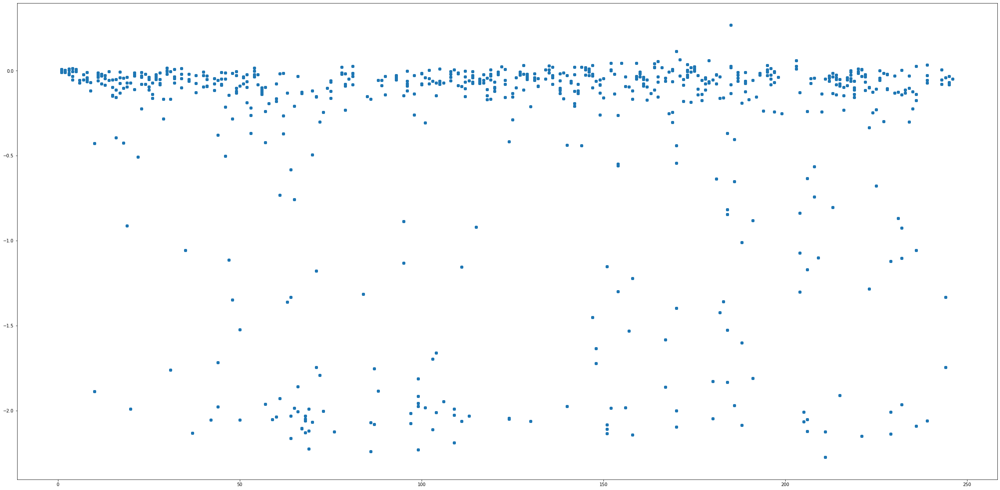

In [42]:
fig, ax = plt.subplots(figsize=(40,20))

bars1 = ax.scatter('position', 'median', data=dfNew_final)

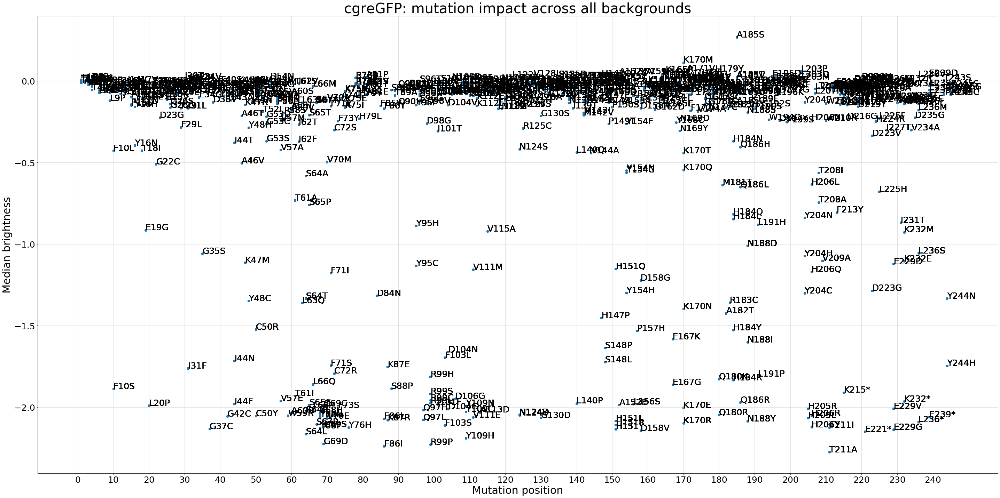

In [43]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'median', data=dfNew_final)
#ax.text('position', 'median', 'mutation', data=dfNew_fin, ha='left', color='grey', fontsize=10)
dfNew_final[['position', 'median', 'mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Median brightness', fontsize=30)
ax.set_xlabel('Mutation position', fontsize=30)
ax.set_title('cgreGFP: mutation impact across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 250, step=10));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)



fig.tight_layout()

#plt.savefig('cgre_bright_annot.png', dpi=300)

In [61]:
dfNew_finally=dfNew_final[['position', 'bright_context', 'median', 'mutation','bac_num']]
dfNew_threshold=dfNew_thres[['position', 'bright_context', 'median', 'mutation','bac_num']]

In [62]:
dfNew_finally['stdev']=""

for index, row in dfNew_finally.iterrows():
    pos = row['mutation']
    dfNew_finally['stdev'][index] = dfNew_finally[dfNew_finally['mutation']==pos].bright_context.std()

dfNew_finally = dfNew_finally.sort_values(['median'],ascending=False)
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\Elisenda\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

,position,bright_context,median,mutation,bac_num,stdev
4585,185,0.026583,0.267831,A185S,6,0.162584
23250,185,0.279402,0.267831,A185S,6,0.162584
4187,185,0.440716,0.267831,A185S,6,0.162584
17344,185,0.379698,0.267831,A185S,6,0.162584
8579,185,0.256260,0.267831,A185S,6,0.162584
...,...,...,...,...,...,...
20979,211,-2.456900,-2.27541,T211A,10,0.443297
11407,211,-2.073760,-2.27541,T211A,10,0.443297
15387,211,-2.393228,-2.27541,T211A,10,0.443297
14002,211,-1.298491,-2.27541,T211A,10,0.443297


In [63]:
dfNew_threshold['stdev']=""

for index, row in dfNew_threshold.iterrows():
    pos = row['mutation']
    dfNew_threshold['stdev'][index] = dfNew_threshold[dfNew_threshold['mutation']==pos].bright_context.std()

dfNew_threshold = dfNew_threshold.sort_values(['median'],ascending=False)
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\Elisenda\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py:3331: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

,position,bright_context,median,mutation,bac_num,stdev
4585,185,0.026583,0.267831,A185S,6,0.162584
23250,185,0.279402,0.267831,A185S,6,0.162584
4187,185,0.440716,0.267831,A185S,6,0.162584
17344,185,0.379698,0.267831,A185S,6,0.162584
8579,185,0.256260,0.267831,A185S,6,0.162584
...,...,...,...,...,...,...
19075,184,-2.182863,-0.75,H184Y,19,0.533113
7776,184,-1.833397,-0.75,H184Y,19,0.533113
8207,184,-1.527480,-0.75,H184Y,19,0.533113
20124,184,-2.179012,-0.75,H184Y,19,0.533113


In [64]:
%run "\Users\Elisenda\GFP_global_landscape\analysis\louisa\lgs01a_functions_for_getting_aa_pseudopositions.ipynb"

In [65]:
dfNew_finally['native_mutation']=""

for index, row in dfNew_finally.iterrows():
    mut= row['mutation']
    position=int(mut[1:-1])
    native_pos=str(get_native_position('cgreGFP', position))
    start=mut[:1]
    finish=mut[-1:]
    yourstring = ''.join((start,native_pos,finish))
    dfNew_finally['native_mutation'][index] = yourstring
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


,position,bright_context,median,mutation,bac_num,stdev,native_mutation
4585,185,0.026583,0.267831,A185S,6,0.162584,A182S
23250,185,0.279402,0.267831,A185S,6,0.162584,A182S
4187,185,0.440716,0.267831,A185S,6,0.162584,A182S
17344,185,0.379698,0.267831,A185S,6,0.162584,A182S
8579,185,0.256260,0.267831,A185S,6,0.162584,A182S
...,...,...,...,...,...,...,...
20979,211,-2.456900,-2.27541,T211A,10,0.443297,T205A
11407,211,-2.073760,-2.27541,T211A,10,0.443297,T205A
15387,211,-2.393228,-2.27541,T211A,10,0.443297,T205A
14002,211,-1.298491,-2.27541,T211A,10,0.443297,T205A


In [66]:
dfNew_threshold['native_mutation']=""

for index, row in dfNew_threshold.iterrows():
    mut= row['mutation']
    position=int(mut[1:-1])
    native_pos=str(get_native_position('cgreGFP', position))
    start=mut[:1]
    finish=mut[-1:]
    yourstring = ''.join((start,native_pos,finish))
    dfNew_threshold['native_mutation'][index] = yourstring
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


,position,bright_context,median,mutation,bac_num,stdev,native_mutation
4585,185,0.026583,0.267831,A185S,6,0.162584,A182S
23250,185,0.279402,0.267831,A185S,6,0.162584,A182S
4187,185,0.440716,0.267831,A185S,6,0.162584,A182S
17344,185,0.379698,0.267831,A185S,6,0.162584,A182S
8579,185,0.256260,0.267831,A185S,6,0.162584,A182S
...,...,...,...,...,...,...,...
19075,184,-2.182863,-0.75,H184Y,19,0.533113,H181Y
7776,184,-1.833397,-0.75,H184Y,19,0.533113,H181Y
8207,184,-1.527480,-0.75,H184Y,19,0.533113,H181Y
20124,184,-2.179012,-0.75,H184Y,19,0.533113,H181Y


In [67]:
dfNew_text_final=dfNew_finally.loc[dfNew_finally['median']>0.1]
dfNew_text_final=dfNew_text_final.drop_duplicates('mutation')
dfNew_text_final=dfNew_text_final.sort_values(by=['position'])

dfNew_text_thres=dfNew_threshold.loc[dfNew_threshold['median']>0.1]
dfNew_text_thres=dfNew_text_thres.drop_duplicates('mutation')
dfNew_text_thres=dfNew_text_thres.sort_values(by=['position'])

In [68]:
dfNew_annot_final=dfNew_finally.loc[dfNew_finally['median']>0.1]
dfNew_annot_final = dfNew_annot_final[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_final=dfNew_annot_final.drop_duplicates('mutation')
dfNew_annot_final=dfNew_annot_final.sort_values(by=['position'])

dfNew_annot_thres=dfNew_threshold.loc[dfNew_threshold['median']>0.1]
dfNew_annot_thres = dfNew_annot_thres[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_thres=dfNew_annot_thres.drop_duplicates('mutation')
dfNew_annot_thres=dfNew_annot_thres.sort_values(by=['position'])

In [69]:
killing_mut = ['R96', 'Y68', 'G69', 'E223']

dfNew_annot_kill = dfNew_finally[dfNew_finally['native_mutation'].str.contains(r'R96|Y68|G69|E223')]
dfNew_annot_kill = dfNew_annot_kill[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill=dfNew_annot_kill.drop_duplicates('mutation')
dfNew_annot_kill=dfNew_annot_kill.sort_values(by=['position'])
dfNew_annot_kill

,position,median,mutation,native_mutation
14834,68,-2.03271,Y68H,Y68H
24121,68,-2.05001,Y68C,Y68C
8448,68,-2.06064,Y68N,Y68N
26138,68,-2.12915,Y68F,Y68F
27681,69,-1.99165,G69C,G69C
24116,69,-2.12044,G69S,G69S
5396,69,-2.22555,G69D,G69D
10523,99,-1.81395,R99H,R96H
11042,99,-1.91729,R99S,R96S
11002,99,-1.95759,R99C,R96C


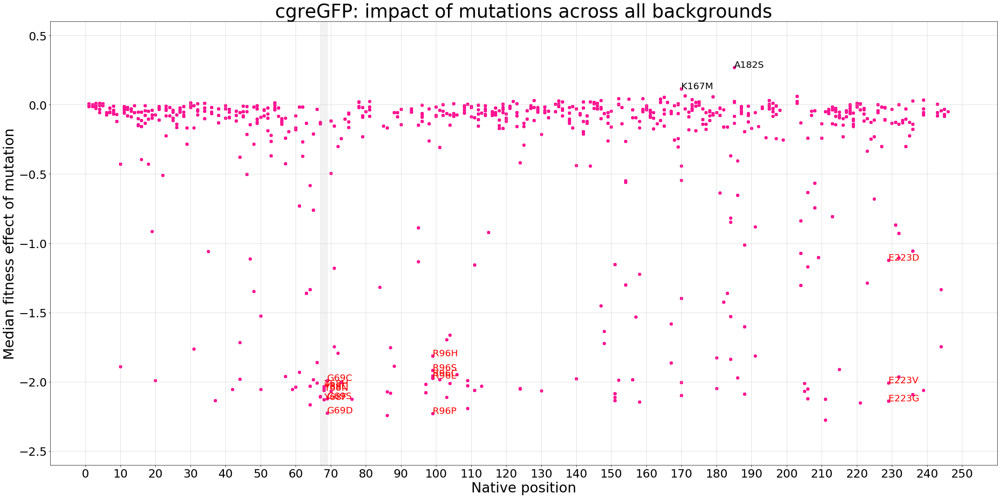

In [77]:
fig, ax = plt.subplots(figsize=(30,15))

ax.scatter('position', 'median', data=dfNew_finally, c='deeppink', s=30)
#ax.text('position', 'median', 'mutation', data=dfNew_fin, ha='left', color='grey', fontsize=10)
dfNew_annot_final[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=20), axis=1)
dfNew_annot_kill[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=20,color='red'), axis=1)

ax.set_ylabel('Median fitness effect of mutation', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('cgreGFP: impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.set_yticks(np.arange(-2.5, 1, step=0.5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_ylim(ymin=-2.6, ymax=0.6)
ax.set_xlim(xmin=-10,xmax=260)
plt.axvspan(67, 69, color='gray', alpha=0.1)


fig.tight_layout()

plt.savefig('cgre_median_impact_scat_final.png', dpi=300)

In [54]:
killing_mut = ['R96', 'Y68', 'G69', 'E223']

dfNew_annot_kill = dfNew_threshold[dfNew_threshold['native_mutation'].str.contains(r'R96|Y68|G69|E223')]
dfNew_annot_kill = dfNew_annot_kill[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill=dfNew_annot_kill.drop_duplicates('mutation')
dfNew_annot_kill=dfNew_annot_kill.sort_values(by=['position'])
dfNew_annot_kill

,position,median,mutation,native_mutation
416,68,-0.75,Y68H,Y68H
2002,68,-0.75,Y68C,Y68C
26138,68,-0.75,Y68F,Y68F
16923,68,-0.75,Y68N,Y68N
33196,69,-0.75,G69C,G69C
11161,69,-0.75,G69S,G69S
12057,69,-0.75,G69D,G69D
860,99,-0.75,R99L,R96L
12314,99,-0.75,R99P,R96P
13983,99,-0.75,R99S,R96S


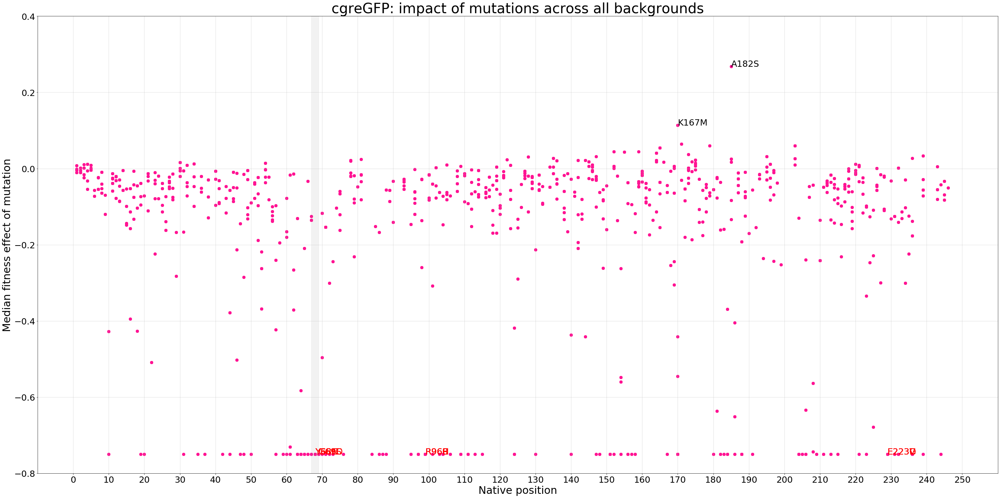

In [55]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'median', data=dfNew_threshold, c='deeppink', s=60)
#ax.text('position', 'median', 'mutation', data=dfNew_fin, ha='left', color='grey', fontsize=10)
dfNew_annot_thres[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)
dfNew_annot_kill[['position', 'median', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25,color='red'), axis=1)

ax.set_ylabel('Median fitness effect of mutation', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('cgreGFP: impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.set_yticks(np.arange(-0.8, 0.6, step=0.2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_ylim(ymin=-0.8, ymax=0.4)
ax.set_xlim(xmin=-10,xmax=260)
plt.axvspan(67, 69, color='gray', alpha=0.1)


fig.tight_layout()

plt.savefig('cgre_median_impact_scat_thres.png', dpi=300)

In [56]:
x = dfNew_annot_thres.mutation.to_string(header=False,
                  index=False).split('\n')
vals = '|'.join(x)
print(vals)

 K170M| A185S


In [72]:
dfNew_annot_kill_final = dfNew_finally[dfNew_finally['native_mutation'].str.contains(r'R96|Y68|G69|E223')]
dfNew_annot_kill_final = dfNew_annot_kill_final[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill_final=dfNew_annot_kill_final.drop_duplicates('mutation')
dfNew_annot_kill_final=dfNew_annot_kill_final.sort_values(by=['position'])

dfNew_annot_kill_thres = dfNew_threshold[dfNew_threshold['native_mutation'].str.contains(r'R96|Y68|G69|E223')]
dfNew_annot_kill_thres = dfNew_annot_kill_thres[['position', 'median', 'mutation', 'native_mutation']]
dfNew_annot_kill_thres=dfNew_annot_kill_thres.drop_duplicates('mutation')
dfNew_annot_kill_thres=dfNew_annot_kill_thres.sort_values(by=['position'])

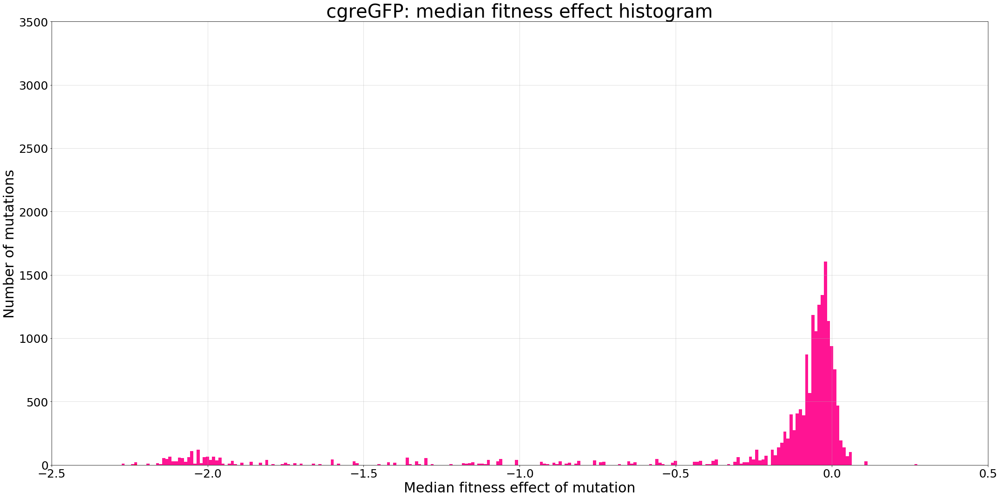

In [73]:
fig, ax = plt.subplots(figsize=(30,15))
data=dfNew_finally['median']
data1=dfNew_annot_kill_final['median']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.01),color='deeppink')
ax.hist(data1, bins=np.arange(min(data), max(data) + 0.01, 0.01), color='red')
ax.set_xlabel('Median fitness effect of mutation', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('cgreGFP: median fitness effect histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(-6.2, 1, step=0.2));
#ax.set_yticks(np.arange(0, 7500, step=500));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-6, xmax=1)
#ax.set_ylim(ymax=7000)
ax.set_xticks(np.arange(-2.5, 1, step=0.5));
ax.set_yticks(np.arange(0, 4000, step=500));


fig.tight_layout()
plt.savefig('cgre_median_impact_hist_final.png', dpi=300)

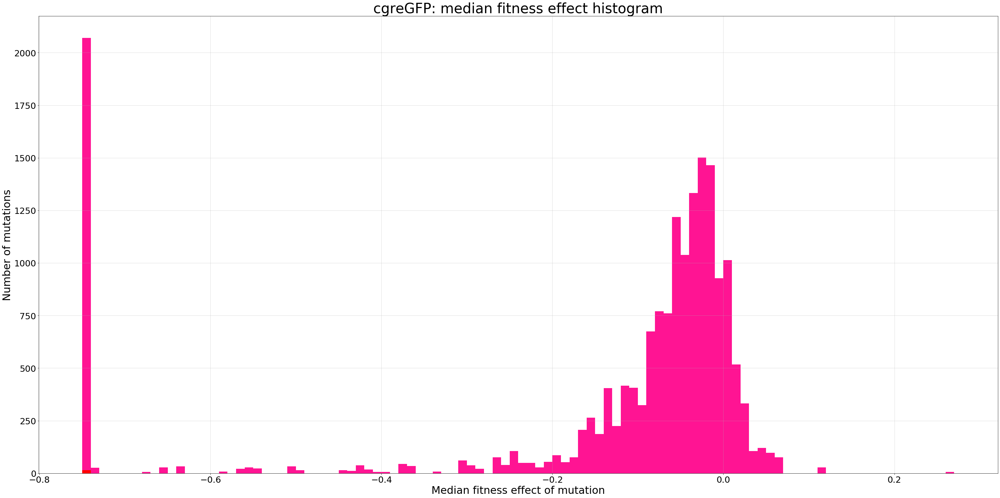

In [59]:
fig, ax = plt.subplots(figsize=(40,20))
data=dfNew_threshold['median']
data1=dfNew_annot_kill_thres['median']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.01),color='deeppink')
ax.hist(data1, bins=np.arange(min(data), max(data) + 0.01, 0.01), color='red')
ax.set_xlabel('Median fitness effect of mutation', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('cgreGFP: median fitness effect histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(-0.8, 0.9, step=0.2));
#ax.set_yticks(np.arange(0, 7500, step=500));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-0.8)
#ax.set_ylim(ymax=7000)

fig.tight_layout()
plt.savefig('cgre_median_impact_hist_thres.png', dpi=300)

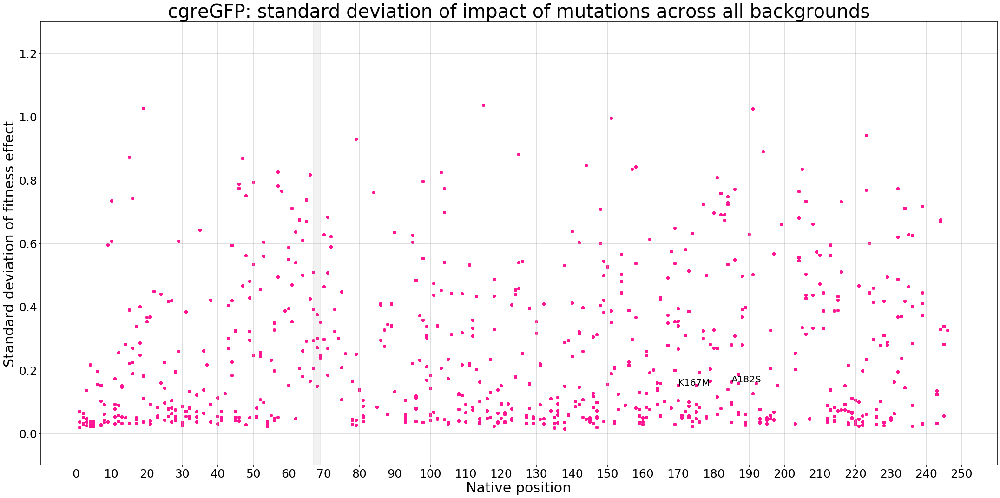

In [75]:
fig, ax = plt.subplots(figsize=(30,15))

ax.scatter('position', 'stdev', data=dfNew_finally, c='deeppink', s=30)
dfNew_text_final[['position', 'stdev', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=20), axis=1)

ax.set_ylabel('Standard deviation of fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('cgreGFP: standard deviation of impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.set_yticks(np.arange(0, 1.4, step=0.2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
ax.set_ylim(ymin=-0.1,ymax=1.3)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('cgre_stdev_scat_final.png', dpi=300)

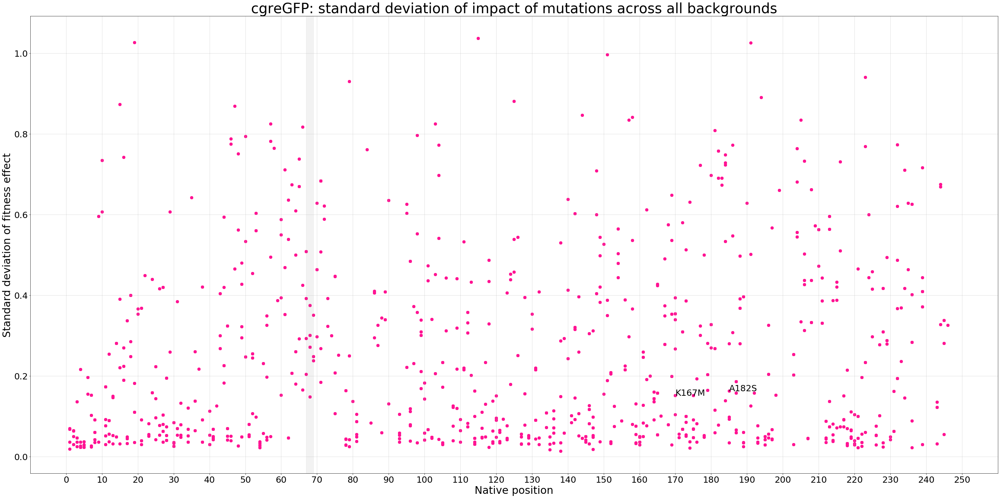

In [61]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'stdev', data=dfNew_threshold, c='deeppink', s=60)
dfNew_text_thres[['position', 'stdev', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Standard deviation of fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('cgreGFP: standard deviation of impact of mutations across all backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
#ax.set_yticks(np.arange(-0.2, 2.8, step=0.2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
#ax.set_ylim(ymin=-0.1,ymax=2.6)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('cgre_stdev_scat_thres.png', dpi=300)

In [62]:
dfNew_finally['ben_vs_del'] = dfNew_finally['bright_context']
dfNew_threshold['ben_vs_del'] = dfNew_threshold['bright_context']

In [63]:
dfNew_finally['ben_vs_del'].values[dfNew_finally['ben_vs_del'] > 0] = 1
dfNew_finally['ben_vs_del'].values[dfNew_finally['ben_vs_del'] < 0] = 0

dfNew_threshold['ben_vs_del'].values[dfNew_threshold['ben_vs_del'] > 0] = 1
dfNew_threshold['ben_vs_del'].values[dfNew_threshold['ben_vs_del'] < 0] = 0

In [64]:
dfNew_threshold['comparison']=""

for index, row in dfNew_threshold.iterrows():
    pos = row['mutation']
    dfNew_threshold['comparison'][index] = dfNew_threshold[dfNew_threshold['mutation']==pos].ben_vs_del.sum()

dfNew_threshold = dfNew_threshold.sort_values(['median'],ascending=False)
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison
4585,185,0.026583,0.267831,A185S,6,0.162584,A182S,1.0,6
8579,185,0.256260,0.267831,A185S,6,0.162584,A182S,1.0,6
22707,185,0.081572,0.267831,A185S,6,0.162584,A182S,1.0,6
23250,185,0.279402,0.267831,A185S,6,0.162584,A182S,1.0,6
17344,185,0.379698,0.267831,A185S,6,0.162584,A182S,1.0,6
...,...,...,...,...,...,...,...,...,...
11407,211,-2.073760,-0.75,T211A,10,0.443297,T205A,0.0,0
15387,211,-2.393228,-0.75,T211A,10,0.443297,T205A,0.0,0
14002,211,-1.298491,-0.75,T211A,10,0.443297,T205A,0.0,0
25559,86,-2.924869,-0.75,F86I,6,0.294907,F84I,0.0,0


In [65]:
dfNew_finally['comparison']=""

for index, row in dfNew_finally.iterrows():
    pos = row['mutation']
    dfNew_finally['comparison'][index] = dfNew_finally[dfNew_finally['mutation']==pos].ben_vs_del.sum()

dfNew_finally = dfNew_finally.sort_values(['median'],ascending=False)
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison
4585,185,0.026583,0.267831,A185S,6,0.162584,A182S,1.0,6
8579,185,0.256260,0.267831,A185S,6,0.162584,A182S,1.0,6
22707,185,0.081572,0.267831,A185S,6,0.162584,A182S,1.0,6
23250,185,0.279402,0.267831,A185S,6,0.162584,A182S,1.0,6
17344,185,0.379698,0.267831,A185S,6,0.162584,A182S,1.0,6
...,...,...,...,...,...,...,...,...,...
20979,211,-2.456900,-2.27541,T211A,10,0.443297,T205A,0.0,0
11407,211,-2.073760,-2.27541,T211A,10,0.443297,T205A,0.0,0
15387,211,-2.393228,-2.27541,T211A,10,0.443297,T205A,0.0,0
14002,211,-1.298491,-2.27541,T211A,10,0.443297,T205A,0.0,0


In [66]:
#dfNew_comp['ones']=1
#position=dfNew_comp['mutation']
#sum_pos = {}
#for pos in position:
    #posit = dfNew_comp[dfNew_comp['mutation']== pos]
    #sum_pos[pos] = posit['ones'].sum()
    
#sum_pos = pd.DataFrame.from_dict(sum_pos, orient='index')
#sum_pos.columns =['total']
#sum_pos = sum_pos.rename_axis('mutation').reset_index()
#dfNew_total= pd.merge(dfNew_comp, sum_pos, on='mutation')
#dfNew_comp =dfNew_comp.dropna()
dfNew_finally['percentage']=dfNew_finally['comparison']/dfNew_finally['bac_num']
dfNew_threshold['percentage']=dfNew_threshold['comparison']/dfNew_threshold['bac_num']

In [67]:
dfNew_finally = dfNew_finally.rename(columns={'percentage': 'ben_percentage'})
dfNew_finally['del_percentage']=1-dfNew_finally['ben_percentage']

dfNew_threshold = dfNew_threshold.rename(columns={'percentage': 'ben_percentage'})
dfNew_threshold['del_percentage']=1-dfNew_threshold['ben_percentage']

In [68]:
dfNew_finally=dfNew_finally.sort_values(by=['ben_percentage'])
dfNew_threshold=dfNew_threshold.sort_values(by=['ben_percentage'])

In [69]:
dfNew_tag_final=dfNew_finally.loc[dfNew_finally['median']>0.1]
dfNew_tag_final=dfNew_tag_final.drop_duplicates('mutation')
dfNew_tag_final=dfNew_tag_final.sort_values(by=['position'])

dfNew_tag_thres=dfNew_threshold.loc[dfNew_threshold['median']>0.1]
dfNew_tag_thres=dfNew_tag_thres.drop_duplicates('mutation')
dfNew_tag_thres=dfNew_tag_thres.sort_values(by=['position'])

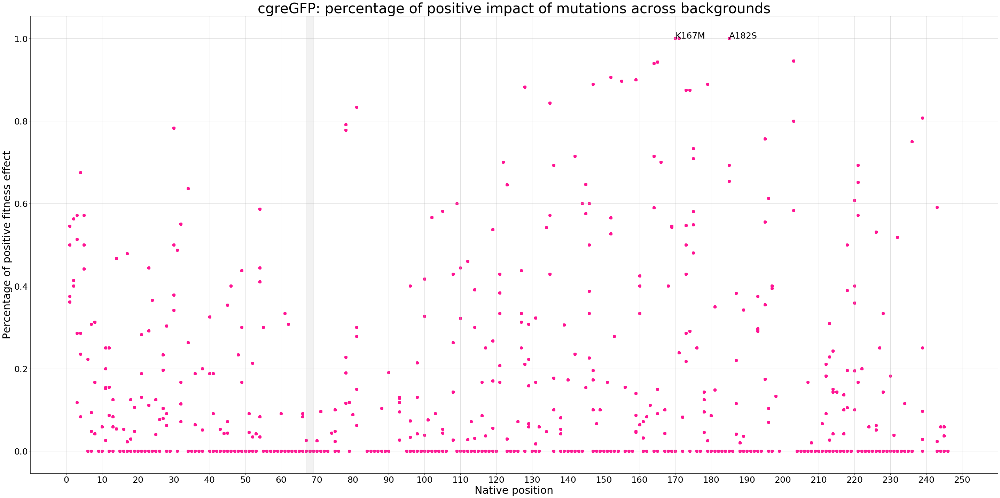

In [70]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'ben_percentage', data=dfNew_finally, c='deeppink', s=60)
dfNew_tag_final[['position', 'ben_percentage', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Percentage of positive fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('cgreGFP: percentage of positive impact of mutations across backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
#ax.set_ylim(ymin=-0.1,ymax=1.1)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('cgre_percentage_scat_final.png', dpi=300)

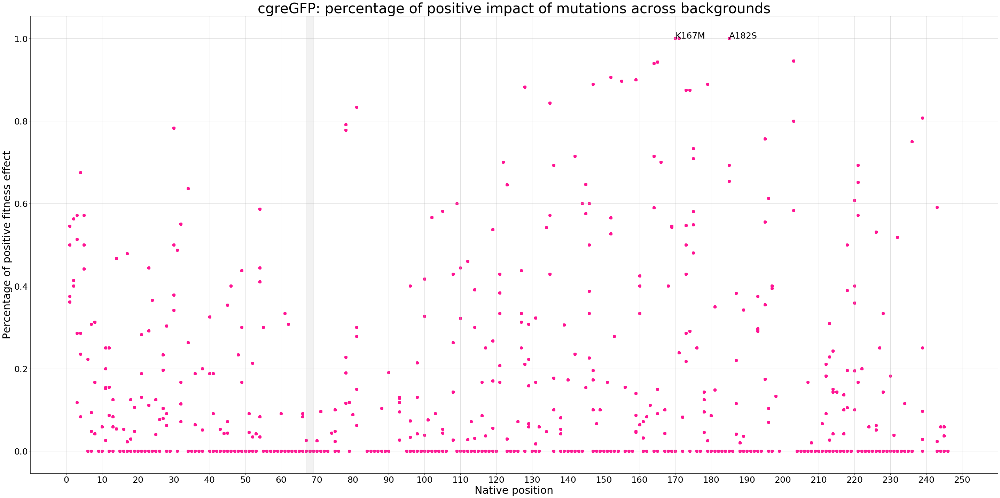

In [71]:
fig, ax = plt.subplots(figsize=(40,20))

ax.scatter('position', 'ben_percentage', data=dfNew_threshold, c='deeppink', s=60)
dfNew_tag_thres[['position', 'ben_percentage', 'native_mutation']].apply(lambda row: ax.text(*row,fontsize=25), axis=1)

ax.set_ylabel('Percentage of positive fitness effect', fontsize=30)
ax.set_xlabel('Native position', fontsize=30)
ax.set_title('cgreGFP: percentage of positive impact of mutations across backgrounds', fontsize=40)
ax.set_xticks(np.arange(0, 260, step=10));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=25)
ax.set_xlim(xmin=-10,xmax=260)
#ax.set_ylim(ymin=-0.1,ymax=1.1)
plt.axvspan(67, 69, color='gray', alpha=0.1)

fig.tight_layout()
plt.savefig('cgre_percentage_scat_thres.png', dpi=300)

In [72]:
dfNew_finally=dfNew_finally.astype({'median': 'float64','bac_num': 'int64','stdev': 'float64','comparison': 'float64','ben_percentage': 'float64','del_percentage': 'float64'})
dfNew_threshold=dfNew_threshold.astype({'median': 'float64','bac_num': 'int64','stdev': 'float64','comparison': 'float64','ben_percentage': 'float64','del_percentage': 'float64'})

In [73]:
dfNew_finally.dtypes

position             int64
bright_context     float64
median             float64
mutation            object
bac_num              int64
stdev              float64
native_mutation     object
ben_vs_del         float64
comparison         float64
ben_percentage     float64
del_percentage     float64
dtype: object

In [74]:
to_plot_final=dfNew_finally.groupby('mutation').ben_percentage.agg(np.mean).sort_values()
to_plot_thres=dfNew_threshold.groupby('mutation').ben_percentage.agg(np.mean).sort_values()

In [75]:
dfNew_finally.to_csv('cgre_percentage_final.csv')
dfNew_threshold.to_csv('cgre_percentage_thres.csv')

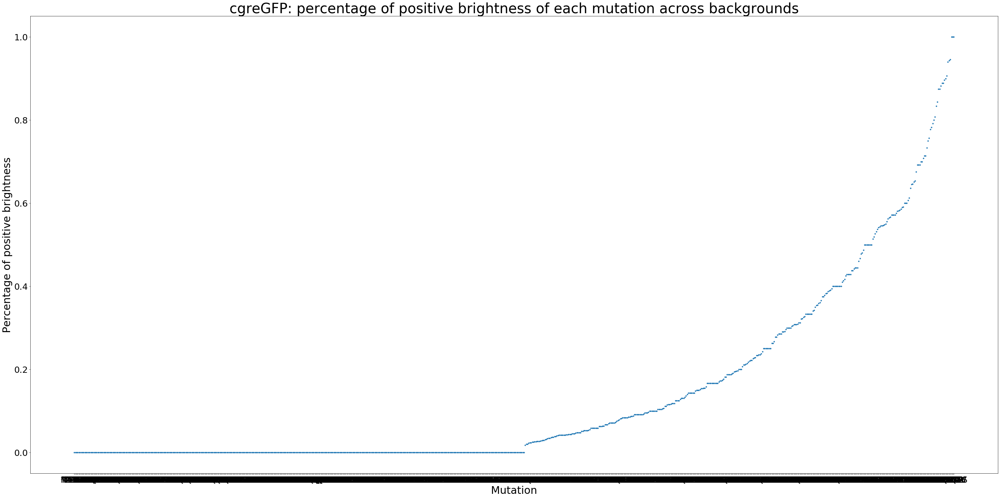

In [76]:
fig, ax = plt.subplots(figsize=(40,20))

ax.plot(to_plot_final, '.')

ax.set_ylabel('Percentage of positive brightness', fontsize=30)
ax.set_xlabel('Mutation', fontsize=30)
ax.set_title('cgreGFP: percentage of positive brightness of each mutation across backgrounds', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)



fig.tight_layout()
#plt.savefig('cgre_bright_percentage_pseudo.png', dpi=300)

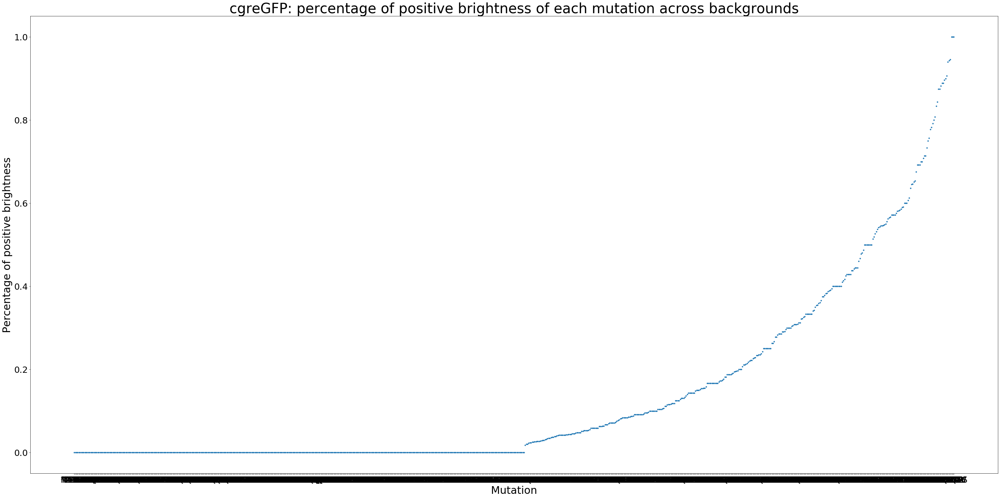

In [77]:
fig, ax = plt.subplots(figsize=(40,20))

ax.plot(to_plot_thres, '.')

ax.set_ylabel('Percentage of positive brightness', fontsize=30)
ax.set_xlabel('Mutation', fontsize=30)
ax.set_title('cgreGFP: percentage of positive brightness of each mutation across backgrounds', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)



fig.tight_layout()
#plt.savefig('cgre_bright_percentage_pseudo.png', dpi=300)

In [78]:
to_plot_final=dfNew_finally.groupby('mutation')[['median', 'stdev']].agg(np.mean)
to_plot_final['variance']=to_plot_final['stdev']*to_plot_final['stdev']
to_plot_final['index_disp']=(to_plot_final['variance']*to_plot_final['variance'])/to_plot_final['stdev']
to_plot_final

,median,stdev,variance,index_disp
mutation,,,,
*246G,-0.050268,0.325435,0.105908,0.034466
A113D,-2.032051,0.432674,0.187207,0.081000
A113S,-0.060649,0.202007,0.040807,0.008243
A152E,-1.986661,0.204652,0.041883,0.008571
A152S,0.000189,0.032756,0.001073,0.000035
...,...,...,...,...
Y68N,-2.060643,0.300677,0.090406,0.027183
Y76H,-2.124944,0.251341,0.063172,0.015878
Y95C,-1.132223,0.603462,0.364167,0.219761


In [79]:
to_plot_thres=dfNew_threshold.groupby('mutation')[['median', 'stdev']].agg(np.mean)
to_plot_thres['variance']=to_plot_thres['stdev']*to_plot_thres['stdev']
to_plot_thres['index_disp']=(to_plot_thres['variance']*to_plot_thres['variance'])/to_plot_thres['stdev']
to_plot_thres

,median,stdev,variance,index_disp
mutation,,,,
*246G,-0.050268,0.325435,0.105908,0.034466
A113D,-0.750000,0.432674,0.187207,0.081000
A113S,-0.060649,0.202007,0.040807,0.008243
A152E,-0.750000,0.204652,0.041883,0.008571
A152S,0.000189,0.032756,0.001073,0.000035
...,...,...,...,...
Y68N,-0.750000,0.300677,0.090406,0.027183
Y76H,-0.750000,0.251341,0.063172,0.015878
Y95C,-0.750000,0.603462,0.364167,0.219761


In [80]:
to_plot_final.to_csv('cgre_median_final.csv')
to_plot_thres.to_csv('cgre_median_thres.csv')

In [81]:
to_annotate_final = to_plot_final.loc[to_plot_final['variance']>0.05]
to_annotate_final = to_annotate_final.rename_axis('mutation').reset_index()

to_annotate_thres = to_plot_thres.loc[to_plot_thres['variance']>0.05]
to_annotate_thres = to_annotate_thres.rename_axis('mutation').reset_index()

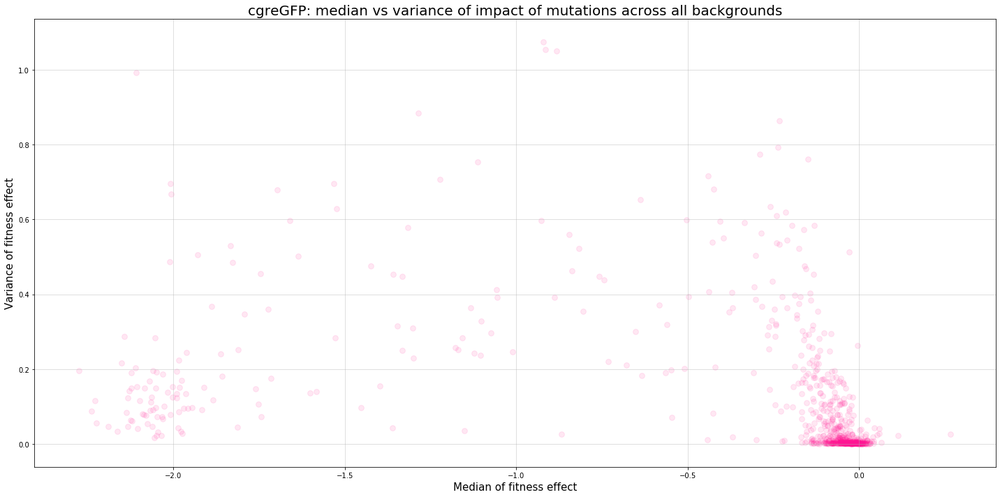

In [82]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','variance', data=to_plot_final, c='deeppink', s=60, alpha=0.1)
#to_annotate[['median', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);


ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('cgreGFP: median vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1, step=0.5));
#ax.set_yticks(np.arange(0,6, step=0.5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6,xmax=1)
#ax.set_ylim(ymin=-0.1)

fig.tight_layout()
plt.savefig('cgre_median_var_final.png', dpi=300)

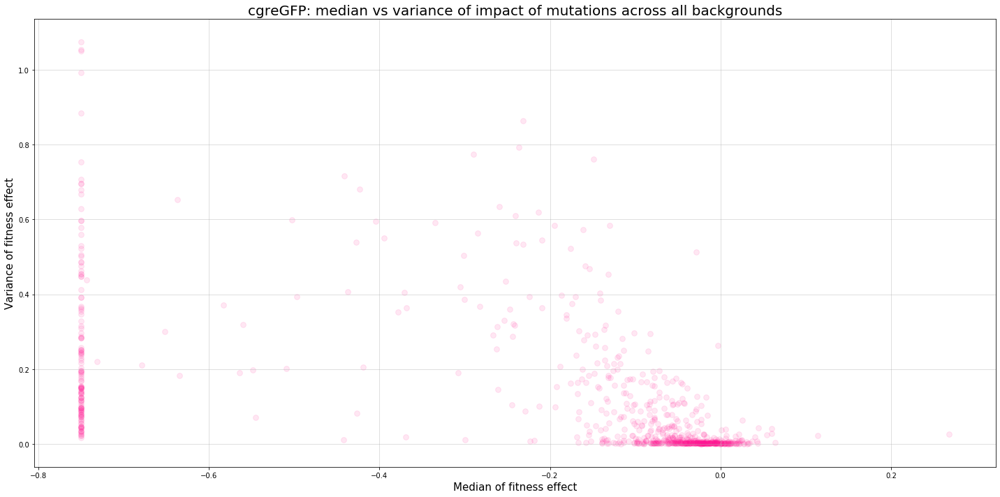

In [83]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','variance', data=to_plot_thres, c='deeppink', s=60, alpha=0.1)
#to_annotate[['median', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);


ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('cgreGFP: median vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-0.8,0.9, step=0.1));
#ax.set_yticks(np.arange(0,6, step=0.5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-0.8,xmax=0.8)
#ax.set_ylim(ymin=-0.1)

fig.tight_layout()
plt.savefig('cgre_median_var_thres.png', dpi=300)

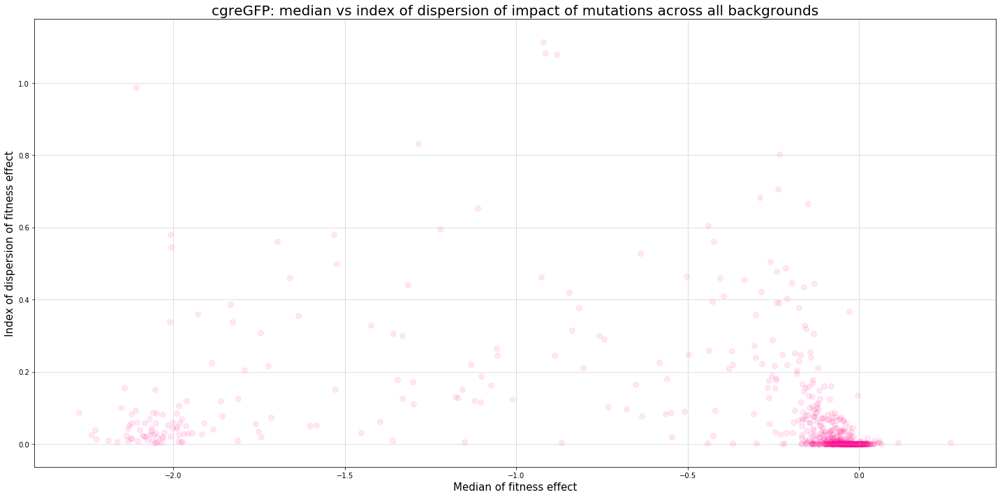

In [84]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','index_disp', data=to_plot_final, c='deeppink', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('cgreGFP: median vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-0.8,0.9, step=0.1));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-0.8,xmax=0.8)
#ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('cgre_median_ind_pseudo.png', dpi=300)

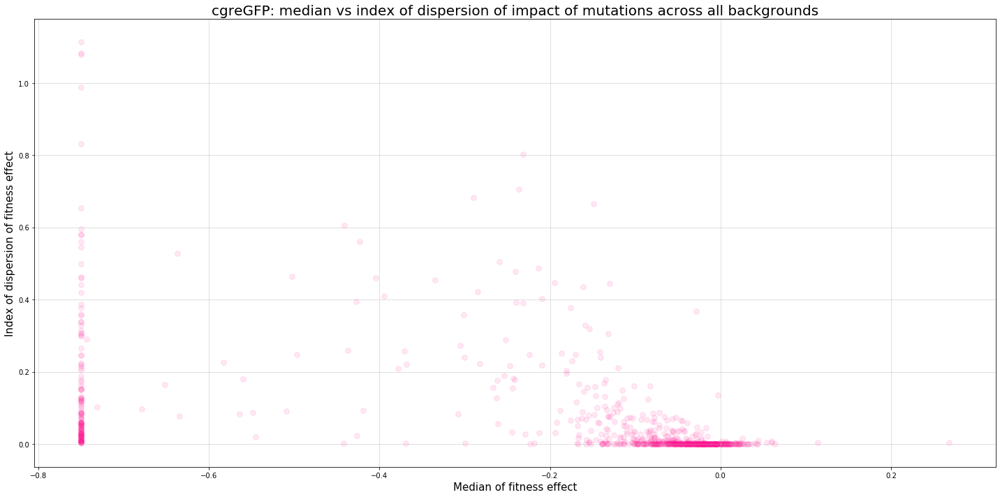

In [85]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('median','index_disp', data=to_plot_thres, c='deeppink', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Median of fitness effect', fontsize=15)
ax.set_title('cgreGFP: median vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-0.8,0.9, step=0.1));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-0.8,xmax=0.8)
#ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('cgre_median_ind_pseudo.png', dpi=300)

In [86]:
dfNew_finally['mean']=""

for index, row in dfNew_finally.iterrows():
    pos = row['mutation']
    dfNew_finally['mean'][index] = dfNew_finally[dfNew_finally['mutation']==pos].bright_context.mean()

dfNew_finally = dfNew_finally.sort_values(['median'],ascending=False)
dfNew_finally

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison,ben_percentage,del_percentage,mean
4585,185,0.026583,0.267831,A185S,6,0.162584,A182S,1.0,6.0,1.0,0.0,0.244039
8579,185,0.256260,0.267831,A185S,6,0.162584,A182S,1.0,6.0,1.0,0.0,0.244039
22707,185,0.081572,0.267831,A185S,6,0.162584,A182S,1.0,6.0,1.0,0.0,0.244039
23250,185,0.279402,0.267831,A185S,6,0.162584,A182S,1.0,6.0,1.0,0.0,0.244039
17344,185,0.379698,0.267831,A185S,6,0.162584,A182S,1.0,6.0,1.0,0.0,0.244039
...,...,...,...,...,...,...,...,...,...,...,...,...
12880,211,-2.266773,-2.275411,T211A,10,0.443297,T205A,0.0,0.0,0.0,1.0,-2.07397
20979,211,-2.456900,-2.275411,T211A,10,0.443297,T205A,0.0,0.0,0.0,1.0,-2.07397
11407,211,-2.073760,-2.275411,T211A,10,0.443297,T205A,0.0,0.0,0.0,1.0,-2.07397
15387,211,-2.393228,-2.275411,T211A,10,0.443297,T205A,0.0,0.0,0.0,1.0,-2.07397


In [87]:
dfNew_threshold['mean']=""

for index, row in dfNew_threshold.iterrows():
    pos = row['mutation']
    dfNew_threshold['mean'][index] = dfNew_threshold[dfNew_threshold['mutation']==pos].bright_context.mean()

dfNew_threshold = dfNew_threshold.sort_values(['median'],ascending=False)
dfNew_threshold

C:\Users\Elisenda\Miniconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,position,bright_context,median,mutation,bac_num,stdev,native_mutation,ben_vs_del,comparison,ben_percentage,del_percentage,mean
4585,185,0.026583,0.267831,A185S,6,0.162584,A182S,1.0,6.0,1.0,0.0,0.244039
8579,185,0.256260,0.267831,A185S,6,0.162584,A182S,1.0,6.0,1.0,0.0,0.244039
22707,185,0.081572,0.267831,A185S,6,0.162584,A182S,1.0,6.0,1.0,0.0,0.244039
23250,185,0.279402,0.267831,A185S,6,0.162584,A182S,1.0,6.0,1.0,0.0,0.244039
17344,185,0.379698,0.267831,A185S,6,0.162584,A182S,1.0,6.0,1.0,0.0,0.244039
...,...,...,...,...,...,...,...,...,...,...,...,...
1030,231,-0.925670,-0.750000,I231T,30,0.161957,I225T,0.0,0.0,0.0,1.0,-0.858519
5925,184,-0.749440,-0.750000,H184L,10,0.748151,H181L,0.0,0.0,0.0,1.0,-1.16535
11493,184,-0.757103,-0.750000,H184L,10,0.748151,H181L,0.0,0.0,0.0,1.0,-1.16535
19019,231,-0.758058,-0.750000,I231T,30,0.161957,I225T,0.0,0.0,0.0,1.0,-0.858519


In [88]:
dfNew_finally=dfNew_finally.astype({'mean': 'float64'})
dfNew_threshold=dfNew_threshold.astype({'mean': 'float64'})

In [89]:
to_plot_final=dfNew_finally.groupby('mutation')[['mean', 'stdev']].agg(np.mean)
to_plot_final['variance']=to_plot_final['stdev']*to_plot_final['stdev']

to_plot_thres=dfNew_threshold.groupby('mutation')[['mean', 'stdev']].agg(np.mean)
to_plot_thres['variance']=to_plot_thres['stdev']*to_plot_thres['stdev']

In [90]:
to_plot_final.to_csv('amac_mean_final.csv')
to_plot_thres.to_csv('amac_mean_thres.csv')

In [91]:
to_annotate_final=to_plot_final.loc[to_plot_final['variance']>0.05]
to_annotate_final = to_annotate_final.rename_axis('mutation').reset_index()

to_annotate_thres=to_plot_thres.loc[to_plot_thres['variance']>0.05]
to_annotate_thres = to_annotate_thres.rename_axis('mutation').reset_index()

In [92]:
dfNew_finally.dtypes

position             int64
bright_context     float64
median             float64
mutation            object
bac_num              int64
stdev              float64
native_mutation     object
ben_vs_del         float64
comparison         float64
ben_percentage     float64
del_percentage     float64
mean               float64
dtype: object

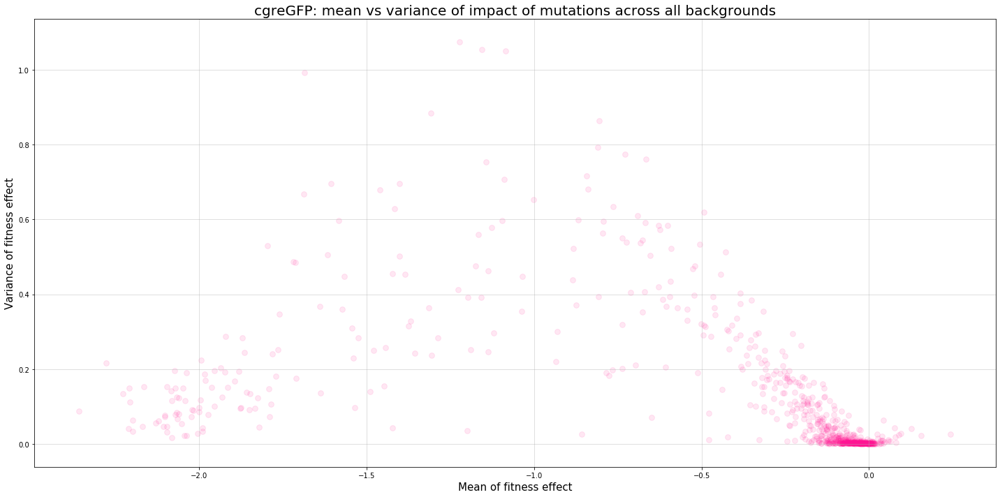

In [93]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','variance', data=to_plot_final, c='deeppink', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('cgreGFP: mean vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,12, step=2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
#ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('cgre_mean_var_pseudo.png', dpi=300)

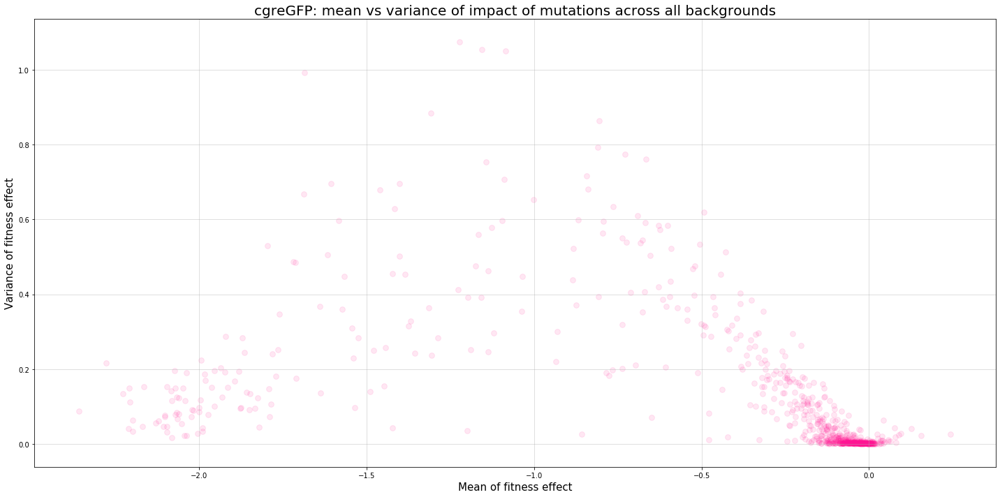

In [94]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','variance', data=to_plot_thres, c='deeppink', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Variance of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('cgreGFP: mean vs variance of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,12, step=2));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
#ax.set_ylim(ymin=-0.5)


fig.tight_layout()
#plt.savefig('cgre_mean_var_pseudo.png', dpi=300)

In [95]:
to_plot_final['index_disp']=(to_plot_final['variance']*to_plot_final['variance'])/to_plot_final['stdev']
to_plot_thres['index_disp']=(to_plot_thres['variance']*to_plot_thres['variance'])/to_plot_thres['stdev']

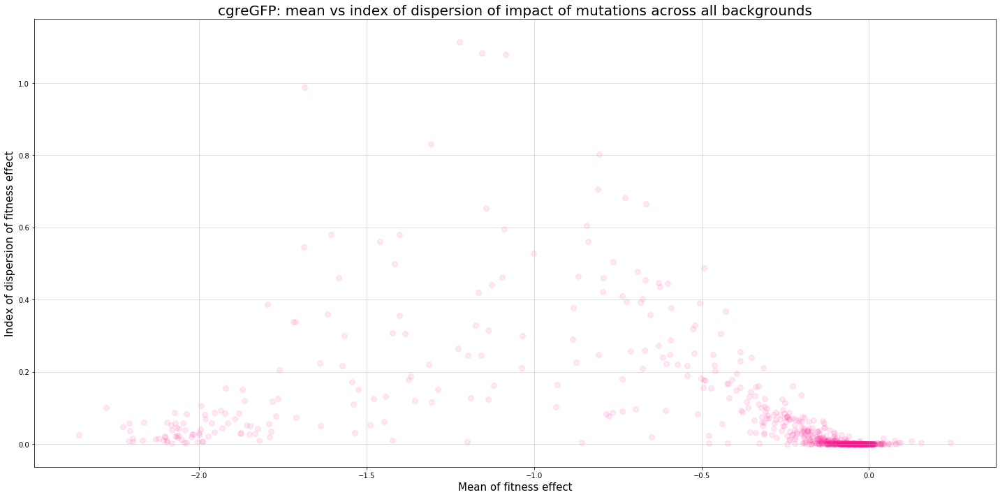

In [96]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','index_disp', data=to_plot_final, c='deeppink', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('cgreGFP: mean vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
#ax.set_ylim(ymin=-1)


fig.tight_layout()
#plt.savefig('cgre_mean_ind_pseudo.png', dpi=300)

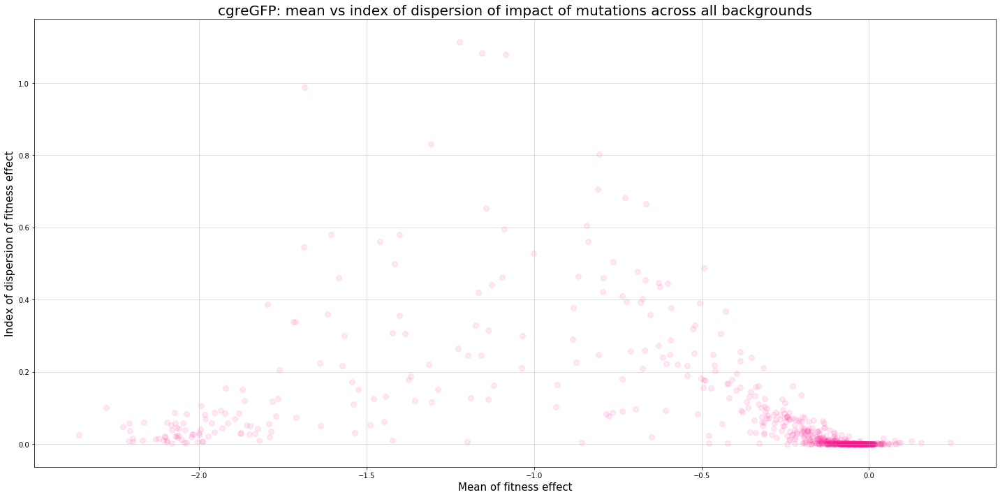

In [97]:
fig, ax = plt.subplots(figsize=(20,10))

ax.scatter('mean','index_disp', data=to_plot_thres, c='deeppink', s=60, alpha=0.1)
#to_annotate[['mean', 'variance', 'mutation']].apply(lambda row: ax.text(*row,fontsize=10), axis=1);

ax.set_ylabel('Index of dispersion of fitness effect', fontsize=15)
ax.set_xlabel('Mean of fitness effect', fontsize=15)
ax.set_title('cgreGFP: mean vs index of dispersion of impact of mutations across all backgrounds', fontsize=20)
#ax.set_xticks(np.arange(-6,1.5, step=0.5));
#ax.set_yticks(np.arange(0,35, step=5));
ax.grid(alpha=0.5)
ax.tick_params(axis='both', which='major', labelsize=10)
#ax.set_xlim(xmin=-6)
#ax.set_ylim(ymin=-1)


fig.tight_layout()
#plt.savefig('cgre_mean_ind_pseudo.png', dpi=300)

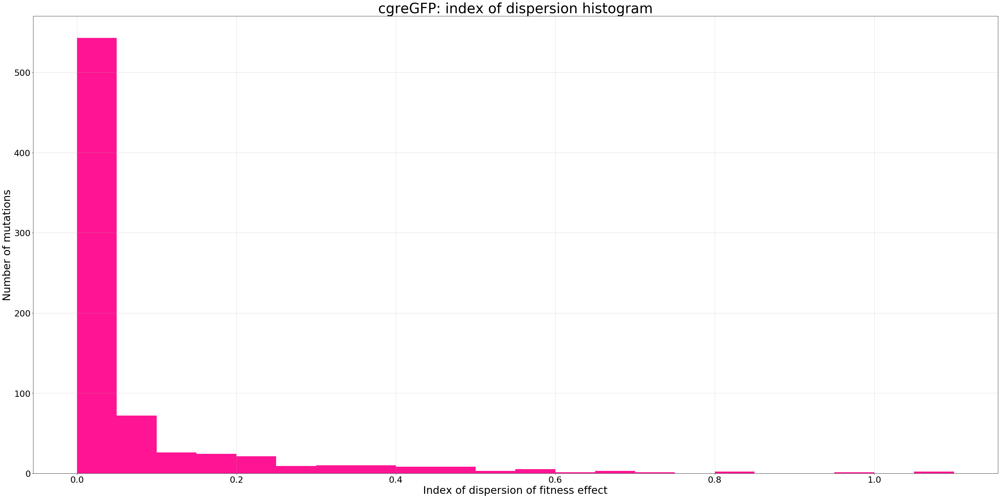

In [98]:
fig, ax = plt.subplots(figsize=(40,20))
data=to_plot_final['index_disp']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.05), color='deeppink')
ax.set_xlabel('Index of dispersion of fitness effect', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('cgreGFP: index of dispersion histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(0, 16, step=1));
#ax.set_yticks(np.arange(0,900, step=100));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-0.1)
#ax.set_ylim(ymax=800)

fig.tight_layout()
#plt.savefig('cgre_ind_hist_pseudo.png', dpi=300)

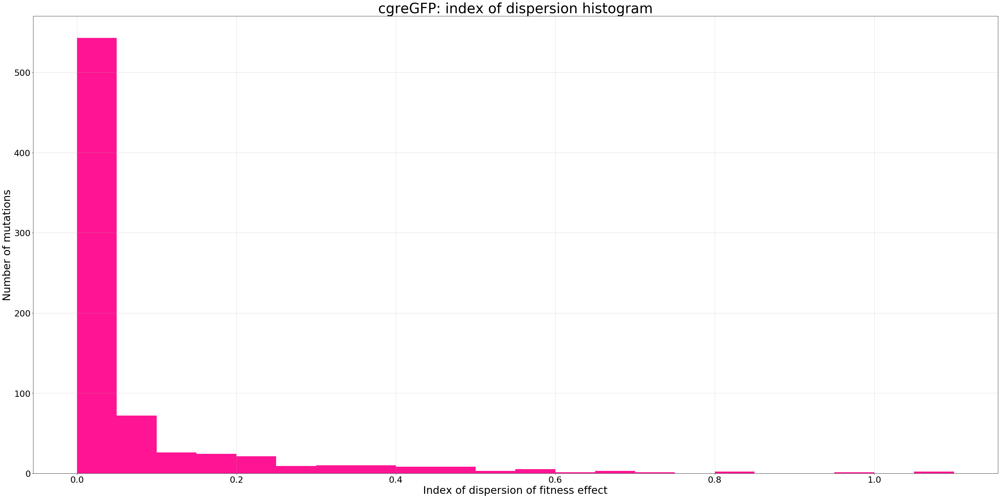

In [99]:
fig, ax = plt.subplots(figsize=(40,20))
data=to_plot_thres['index_disp']
ax.hist(data, bins=np.arange(min(data), max(data) + 0.01, 0.05), color='deeppink')
ax.set_xlabel('Index of dispersion of fitness effect', fontsize=30)
ax.set_ylabel('Number of mutations', fontsize=30)
ax.set_title('cgreGFP: index of dispersion histogram', fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=25)
#ax.set_xticks(np.arange(0, 16, step=1));
#ax.set_yticks(np.arange(0,900, step=100));
ax.grid(alpha=0.5)
#ax.set_xlim(xmin=-0.1)
#ax.set_ylim(ymax=800)

fig.tight_layout()
#plt.savefig('cgre_ind_hist_pseudo.png', dpi=300)

In [100]:
to_plot_final.to_csv('amac_values_final.csv')
to_plot_thres.to_csv('amac_values_thres.csv')